# Week - 49

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Baseline: foodwebs in results BEFORE filter: 290
[INFO] Baseline: foodwebs in results AFTER filter: 157
[INFO] Backbone: foodwebs in results BEFORE filter: 290
[INFO] Backbone: foodwebs in results AFTER filter: 157


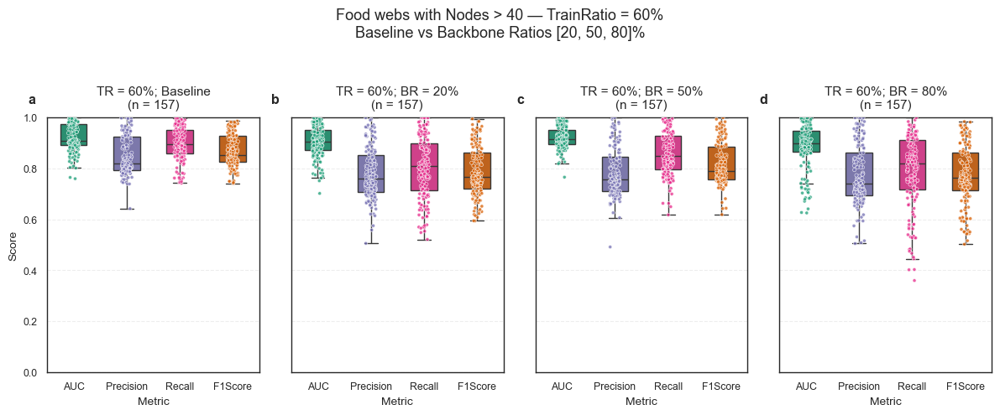

In [2]:
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_context("paper")
sns.set_style("white")

# === Configuration ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs/"
RESULTS_DIR_BB = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_20-50-80/prediction_scores_logs/"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
SINGLE_FILE = None  # set to a CSV path if you want to plot a single file for the baseline
METRICS = ["AUC", "Precision", "Recall", "F1Score"]
MAX_PLOTS = None    # set to an integer to limit how many CSVs are read
NODES_THRESHOLD = 40
TARGET_TR = 60                  # focus on TrainRatio = 60% only
BACKBONE_RATIOS = [20, 50, 80]  # backbone ratios to compare (all at TR=60%)

# === Utility functions ===
def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Make foodweb labels comparable between results CSV and FOODWEB_CSV.
    - strip spaces
    - drop extension (.mat, .csv, etc.)
    - remove common suffixes: _tax_mass, _tax, _mass, _results, _random
    - collapse multiple underscores
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat, .csv, etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results(results_dir=None, single_file=None) -> pd.DataFrame:
    paths = []
    if results_dir and os.path.isdir(results_dir):
        paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
        if MAX_PLOTS is not None:
            paths = paths[:MAX_PLOTS]
            print(f"[INFO] Limiting to first {len(paths)} CSV files for plotting.")
    if single_file and os.path.isfile(single_file):
        paths.append(single_file)
    if not paths:
        raise FileNotFoundError("No CSV files found. Check RESULTS_DIR or SINGLE_FILE.")

    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"Skipping {p}: {e}")
            continue

        df.columns = [c.strip() for c in df.columns]
        # Normalize to upper for metrics, keep original for TrainRatio detection
        upper_map = {c: c.upper() for c in df.columns}
        df = df.rename(columns=upper_map)
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)
        frames.append(df)

    if not frames:
        raise ValueError("No valid results loaded.")
    return pd.concat(frames, ignore_index=True)

# =====================================================================
# 1) Load baseline (no-backbone) results
# =====================================================================
df_base = load_results(results_dir=RESULTS_DIR, single_file=SINGLE_FILE)

# === Load foodweb metadata and filter Nodes > NODES_THRESHOLD ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

# Normalized keys on BOTH sides
meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)

# Allowed food webs by node threshold
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: {len(allowed_fw_keys)}")

# --- Filter baseline by node threshold ---
df_base["FW_KEY"] = df_base["FOODWEB"].apply(normalize_fw_label)
print(f"[INFO] Baseline: foodwebs in results BEFORE filter: {df_base['FW_KEY'].nunique()}")

df_base = df_base[df_base["FW_KEY"].isin(allowed_fw_keys)].copy()
df_base.drop(columns=["FW_KEY"], inplace=True)

print(f"[INFO] Baseline: foodwebs in results AFTER filter: {df_base['FOODWEB'].nunique()}")

if df_base.empty:
    raise ValueError(f"No baseline foodwebs left after filtering Nodes > {NODES_THRESHOLD}.")

# === Normalize TrainRatio into a single 'TRAINRATIO' column (as percentages) ===
tr_candidates_base = [c for c in df_base.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
if not tr_candidates_base:
    raise ValueError("No TrainRatio column found in baseline results.")
tr_col_base = tr_candidates_base[0]

df_base["TRAINRATIO"] = pd.to_numeric(df_base[tr_col_base], errors="coerce")
if df_base["TRAINRATIO"].between(0, 1).all():
    df_base["TRAINRATIO"] = (df_base["TRAINRATIO"] * 100).round().astype(int)
else:
    df_base["TRAINRATIO"] = df_base["TRAINRATIO"].astype(int)

# Keep only TARGET_TR in baseline
df_base = df_base[df_base["TRAINRATIO"] == TARGET_TR].copy()
if df_base.empty:
    raise ValueError(f"No baseline rows with TRAINRATIO = {TARGET_TR}.")

# === Prepare long form (baseline) ===
present = [m for m in METRICS if m.upper() in df_base.columns]
if not present:
    raise ValueError("None of the requested METRICS were found in baseline results.")

long_frames_base = []
for m in present:
    mu = m.upper()
    tmp = df_base[["FOODWEB", "TRAINRATIO", mu]].rename(columns={mu: "Value"})
    tmp["Metric"] = m
    long_frames_base.append(tmp)
df_long_base = pd.concat(long_frames_base, ignore_index=True)

# === Aggregate: mean per FOODWEB (baseline) ===
df_web_means_base = (
    df_long_base
    .groupby(["FOODWEB", "Metric"], as_index=False)["Value"]
    .mean()
)

n_foodwebs_base = df_long_base["FOODWEB"].nunique()

# =====================================================================
# 2) Load backbone results (TR=60%, BR in BACKBONE_RATIOS)
# =====================================================================
df_bb = load_results(results_dir=RESULTS_DIR_BB, single_file=None)

# Filter by same node threshold
df_bb["FW_KEY"] = df_bb["FOODWEB"].apply(normalize_fw_label)
print(f"[INFO] Backbone: foodwebs in results BEFORE filter: {df_bb['FW_KEY'].nunique()}")

df_bb = df_bb[df_bb["FW_KEY"].isin(allowed_fw_keys)].copy()
df_bb.drop(columns=["FW_KEY"], inplace=True)

print(f"[INFO] Backbone: foodwebs in results AFTER filter: {df_bb['FOODWEB'].nunique()}")

if df_bb.empty:
    raise ValueError(f"No backbone foodwebs left after filtering Nodes > {NODES_THRESHOLD}.")

# Normalize TrainRatio in backbone results
tr_candidates_bb = [c for c in df_bb.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
if not tr_candidates_bb:
    raise ValueError("No TrainRatio column found in backbone results.")
tr_col_bb = tr_candidates_bb[0]

df_bb["TRAINRATIO"] = pd.to_numeric(df_bb[tr_col_bb], errors="coerce")
if df_bb["TRAINRATIO"].between(0, 1).all():
    df_bb["TRAINRATIO"] = (df_bb["TRAINRATIO"] * 100).round().astype(int)
else:
    df_bb["TRAINRATIO"] = df_bb["TRAINRATIO"].astype(int)

df_bb = df_bb[df_bb["TRAINRATIO"] == TARGET_TR].copy()
if df_bb.empty:
    raise ValueError(f"No backbone rows with TRAINRATIO = {TARGET_TR}.")

# Normalize BackboneRatio
bb_candidates = [c for c in df_bb.columns if c.lower() in ["backboneratio", "backbone_ratio"]]
if not bb_candidates:
    raise ValueError("No BackboneRatio column found in backbone results.")
bb_col = bb_candidates[0]

df_bb["BACKBONERATIO"] = pd.to_numeric(df_bb[bb_col], errors="coerce")
if df_bb["BACKBONERATIO"].between(0, 1).all():
    df_bb["BACKBONERATIO"] = (df_bb["BACKBONERATIO"] * 100).round().astype(int)
else:
    df_bb["BACKBONERATIO"] = df_bb["BACKBONERATIO"].astype(int)

# Filter to desired backbone ratios
df_bb = df_bb[df_bb["BACKBONERATIO"].isin(BACKBONE_RATIOS)].copy()
if df_bb.empty:
    raise ValueError(f"No backbone rows with BACKBONERATIO in {BACKBONE_RATIOS}.")

# Ensure metrics exist also in backbone
missing_metrics = [m for m in present if m.upper() not in df_bb.columns]
if missing_metrics:
    raise ValueError(f"Backbone results missing metrics: {missing_metrics}")

# Long form for backbone (include BACKBONERATIO)
long_frames_bb = []
for m in present:
    mu = m.upper()
    tmp = df_bb[["FOODWEB", "TRAINRATIO", "BACKBONERATIO", mu]].rename(columns={mu: "Value"})
    tmp["Metric"] = m
    long_frames_bb.append(tmp)
df_long_bb = pd.concat(long_frames_bb, ignore_index=True)

# Aggregate for backbone (per foodweb, per backbone ratio)
df_web_means_bb = (
    df_long_bb
    .groupby(["FOODWEB", "BACKBONERATIO", "Metric"], as_index=False)["Value"]
    .mean()
)

# n foodwebs per backbone ratio
n_foodwebs_bb = {
    br: df_long_bb.loc[df_long_bb["BACKBONERATIO"] == br, "FOODWEB"].nunique()
    for br in BACKBONE_RATIOS
}

# =====================================================================
# 3) Plotting — baseline + backbone BR=10,30,50,70
# =====================================================================
# Colors / palette (unchanged)
metric_colors = {
    "AUC": "#1b9e77", "Precision": "#d95f02",
    "Recall": "#7570b3", "F1Score": "#e7298a",
}
palette = {k: metric_colors.get(k, "#5aa9e6") for k in df_long_base["Metric"].unique()}
order = list(present)
pal_list = [palette[m] for m in order]

n_panels = 1 + len(BACKBONE_RATIOS)
fig, axes = plt.subplots(1, n_panels, figsize=(3 * n_panels, 5), sharey=True)

if n_panels == 1:
    axes = [axes]

panel_letters = [chr(ord("a") + i) for i in range(n_panels)]

# --- Panel 0: baseline ---
ax = axes[0]
sub_web = df_web_means_base

sns.boxplot(
    data=sub_web, x="Metric", y="Value",
    order=order, palette=pal_list,
    hue="Metric",
    width=0.5, showfliers=False,
    ax=ax
)
sns.stripplot(
    data=sub_web, x="Metric", y="Value",
    order=order, palette=pal_list,
    hue="Metric",
    dodge=False, jitter=0.10,
    size=3.0, alpha=0.75,
    edgecolor="white", linewidth=0.5,
    ax=ax
)

if ax.get_legend() is not None:
    ax.get_legend().remove()

ax.annotate(
    panel_letters[0],
    xy=(0, 1), xycoords="axes fraction",
    xytext=(-10, 10), textcoords="offset points",
    ha="right", va="bottom",
    fontsize="large", fontweight="bold",
    annotation_clip=False
)

ax.set_title(f"TR = {TARGET_TR}%; Baseline\n(n = {n_foodwebs_base})", fontsize=11, pad=8)
ax.set_xlabel("Metric", fontsize=10)
ax.set_ylabel("Score", fontsize=10)
ax.set_ylim(0.6, 1.0)
ax.yaxis.set_major_locator(plt.MaxNLocator(6))
ax.grid(True, axis="y", linestyle="--", alpha=0.35)

# --- Panels 1..k: backbone BR in BACKBONE_RATIOS ---
for i, br in enumerate(BACKBONE_RATIOS, start=1):
    ax = axes[i]
    sub_web = df_web_means_bb[df_web_means_bb["BACKBONERATIO"] == br]

    sns.boxplot(
        data=sub_web, x="Metric", y="Value",
        order=order, palette=pal_list,
        hue="Metric",
        width=0.5, showfliers=False,
        ax=ax
    )
    sns.stripplot(
        data=sub_web, x="Metric", y="Value",
        order=order, palette=pal_list,
        hue="Metric",
        dodge=False, jitter=0.10,
        size=3.0, alpha=0.75,
        edgecolor="white", linewidth=0.5,
        ax=ax
    )

    if ax.get_legend() is not None:
        ax.get_legend().remove()

    ax.annotate(
        panel_letters[i],
        xy=(0, 1), xycoords="axes fraction",
        xytext=(-10, 10), textcoords="offset points",
        ha="right", va="bottom",
        fontsize="large", fontweight="bold",
        annotation_clip=False
    )

    ax.set_title(
        f"TR = {TARGET_TR}%; BR = {br}%\n(n = {n_foodwebs_bb.get(br, 0)})",
        fontsize=11,
        pad=8
    )
    ax.set_xlabel("Metric", fontsize=10)
    ax.set_ylabel("" if i > 0 else "Score")
    ax.set_ylim(0, 1.0)
    ax.yaxis.set_major_locator(plt.MaxNLocator(6))
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)

fig.suptitle(
    f"Food webs with Nodes > {NODES_THRESHOLD} — TrainRatio = {TARGET_TR}%\n"
    f"Baseline vs Backbone Ratios {BACKBONE_RATIOS}%",
    y=0.98, fontsize=13
)

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

[INFO] Ecosystem 'Marine': allowed foodwebs (Nodes > 40) = 47
[INFO] Ecosystem 'Lakes': allowed foodwebs (Nodes > 40) = 25
[INFO] Ecosystem 'Streams': allowed foodwebs (Nodes > 40) = 19
[INFO] Ecosystem 'Terrestrial aboveground': allowed foodwebs (Nodes > 40) = 14
[INFO] Ecosystem 'Terrestrial belowground': allowed foodwebs (Nodes > 40) = 52


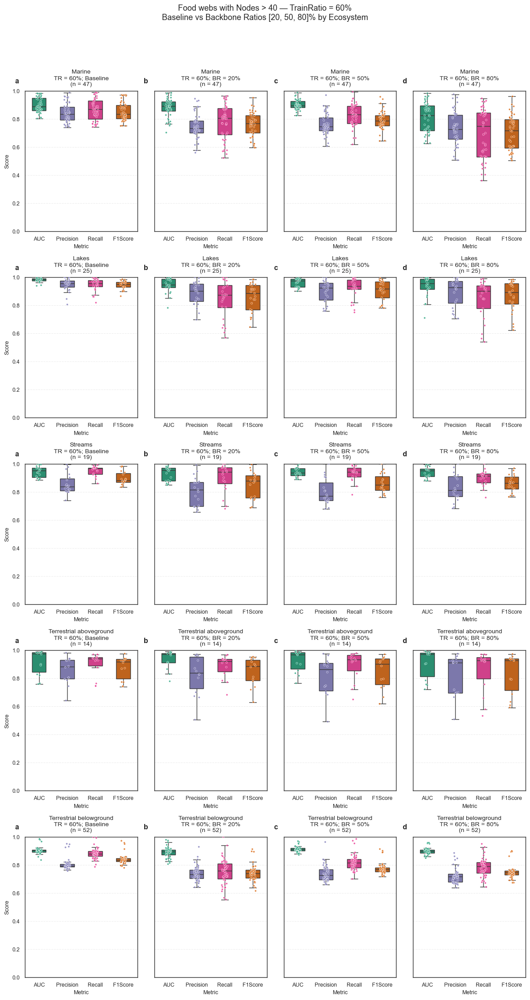

In [1]:
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_context("paper")
sns.set_style("white")

# === Configuration ===
RESULTS_DIR = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs/"
RESULTS_DIR_BB = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_20-50-80/prediction_scores_logs/"
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
SINGLE_FILE = None  # set to a CSV path if you want to plot a single file for the baseline
METRICS = ["AUC", "Precision", "Recall", "F1Score"]
MAX_PLOTS = None    # set to an integer to limit how many CSVs are read
NODES_THRESHOLD = 40
TARGET_TR = 60                  # focus on TrainRatio = 60% only
BACKBONE_RATIOS = [20, 50, 80]  # backbone ratios to compare (all at TR=60%)

# Ecosystems to loop over (must match EcosystemType values in FOODWEB_CSV, case-insensitive)
ECOSYSTEMS = [
    "Marine",
    "Lakes",
    "Streams",
    "Terrestrial aboveground",
    "Terrestrial belowground",
]

# === Utility functions ===
def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    """
    Make foodweb labels comparable between results CSV and FOODWEB_CSV.
    - strip spaces
    - drop extension (.mat, .csv, etc.)
    - remove common suffixes: _tax_mass, _tax, _mass, _results, _random
    - collapse multiple underscores
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat, .csv, etc.
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results(results_dir=None, single_file=None) -> pd.DataFrame:
    paths = []
    if results_dir and os.path.isdir(results_dir):
        paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
        if MAX_PLOTS is not None:
            paths = paths[:MAX_PLOTS]
            print(f"[INFO] Limiting to first {len(paths)} CSV files for plotting.")
    if single_file and os.path.isfile(single_file):
        paths.append(single_file)
    if not paths:
        raise FileNotFoundError("No CSV files found. Check RESULTS_DIR or SINGLE_FILE.")

    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"Skipping {p}: {e}")
            continue

        df.columns = [c.strip() for c in df.columns]
        # Normalize to upper for metrics, keep original for TrainRatio detection
        upper_map = {c: c.upper() for c in df.columns}
        df = df.rename(columns=upper_map)
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)
        frames.append(df)

    if not frames:
        raise ValueError("No valid results loaded.")
    return pd.concat(frames, ignore_index=True)

# =====================================================================
# 1) Load baseline (no-backbone) results (all ecosystems)
# =====================================================================
df_base_all = load_results(results_dir=RESULTS_DIR, single_file=SINGLE_FILE)

# === Load foodweb metadata ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
eco_col_candidates = [c for c in meta.columns if c.lower() in ["ecosystemtype", "ecosystem_type", "ecosystem"]]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")
if not eco_col_candidates:
    raise ValueError("Could not find an ecosystem column (e.g., 'EcosystemType') in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]
eco_col = eco_col_candidates[0]

# Normalized keys on BOTH sides
meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
df_base_all["FW_KEY"] = df_base_all["FOODWEB"].apply(normalize_fw_label)

# === Normalize TrainRatio in baseline (all ecosystems) ===
tr_candidates_base = [c for c in df_base_all.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
if not tr_candidates_base:
    raise ValueError("No TrainRatio column found in baseline results.")
tr_col_base = tr_candidates_base[0]

df_base_all["TRAINRATIO"] = pd.to_numeric(df_base_all[tr_col_base], errors="coerce")
if df_base_all["TRAINRATIO"].between(0, 1).all():
    df_base_all["TRAINRATIO"] = (df_base_all["TRAINRATIO"] * 100).round().astype(int)
else:
    df_base_all["TRAINRATIO"] = df_base_all["TRAINRATIO"].astype(int)

# Keep only TARGET_TR in baseline
df_base_all = df_base_all[df_base_all["TRAINRATIO"] == TARGET_TR].copy()
if df_base_all.empty:
    raise ValueError(f"No baseline rows with TRAINRATIO = {TARGET_TR} in any ecosystem.")

# Determine which metrics are actually present
present = [m for m in METRICS if m.upper() in df_base_all.columns]
if not present:
    raise ValueError("None of the requested METRICS were found in baseline results.")

# =====================================================================
# 2) Load backbone results (TR=60%, BR in BACKBONE_RATIOS, all ecosystems)
# =====================================================================
df_bb_all = load_results(results_dir=RESULTS_DIR_BB, single_file=None)
df_bb_all["FW_KEY"] = df_bb_all["FOODWEB"].apply(normalize_fw_label)

# Normalize TrainRatio in backbone results
tr_candidates_bb = [c for c in df_bb_all.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
if not tr_candidates_bb:
    raise ValueError("No TrainRatio column found in backbone results.")
tr_col_bb = tr_candidates_bb[0]

df_bb_all["TRAINRATIO"] = pd.to_numeric(df_bb_all[tr_col_bb], errors="coerce")
if df_bb_all["TRAINRATIO"].between(0, 1).all():
    df_bb_all["TRAINRATIO"] = (df_bb_all["TRAINRATIO"] * 100).round().astype(int)
else:
    df_bb_all["TRAINRATIO"] = df_bb_all["TRAINRATIO"].astype(int)

df_bb_all = df_bb_all[df_bb_all["TRAINRATIO"] == TARGET_TR].copy()
if df_bb_all.empty:
    raise ValueError(f"No backbone rows with TRAINRATIO = {TARGET_TR} in any ecosystem.")

# Normalize BackboneRatio
bb_candidates = [c for c in df_bb_all.columns if c.lower() in ["backboneratio", "backbone_ratio"]]
if not bb_candidates:
    raise ValueError("No BackboneRatio column found in backbone results.")
bb_col = bb_candidates[0]

df_bb_all["BACKBONERATIO"] = pd.to_numeric(df_bb_all[bb_col], errors="coerce")
if df_bb_all["BACKBONERATIO"].between(0, 1).all():
    df_bb_all["BACKBONERATIO"] = (df_bb_all["BACKBONERATIO"] * 100).round().astype(int)
else:
    df_bb_all["BACKBONERATIO"] = df_bb_all["BACKBONERATIO"].astype(int)

# Filter to desired backbone ratios
df_bb_all = df_bb_all[df_bb_all["BACKBONERATIO"].isin(BACKBONE_RATIOS)].copy()
if df_bb_all.empty:
    raise ValueError(f"No backbone rows with BACKBONERATIO in {BACKBONE_RATIOS} in any ecosystem.")

# Ensure metrics exist also in backbone
missing_metrics = [m for m in present if m.upper() not in df_bb_all.columns]
if missing_metrics:
    raise ValueError(f"Backbone results missing metrics: {missing_metrics}")

# =====================================================================
# 3) Plotting — multiple rows (ecosystems) x columns (baseline + BR=10,30,50,70)
# =====================================================================
# Colors / palette (unchanged)
metric_colors = {
    "AUC": "#1b9e77", "Precision": "#d95f02",
    "Recall": "#7570b3", "F1Score": "#e7298a",
}
palette = {k: metric_colors.get(k, "#5aa9e6") for k in present}
order = list(present)
pal_list = [palette[m] for m in order]

n_rows = len(ECOSYSTEMS)
n_cols = 1 + len(BACKBONE_RATIOS)  # baseline + backbone ratios
fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 4.5 * n_rows), sharey=True)

# Ensure axes is 2D array
if n_rows == 1:
    axes = np.array([axes])
if n_cols == 1:
    axes = axes.reshape(n_rows, 1)

for row_idx, eco_name in enumerate(ECOSYSTEMS):
    # Panel letters restart per row: a, b, c, ...
    row_panel_letters = [chr(ord("a") + i) for i in range(n_cols)]

    # --- Ecosystem-specific allowed FW_KEYs ---
    eco_mask = (
        meta[eco_col]
        .astype(str)
        .str.strip()
        .str.lower()
        == eco_name.lower()
    )
    mask_allowed = (meta[nodes_col] > NODES_THRESHOLD) & eco_mask
    allowed_fw_keys = set(meta.loc[mask_allowed, "FW_KEY"].unique())

    print(f"[INFO] Ecosystem '{eco_name}': allowed foodwebs (Nodes > {NODES_THRESHOLD}) = {len(allowed_fw_keys)}")

    # --- Filter baseline and backbone for this ecosystem ---
    df_base = df_base_all[df_base_all["FW_KEY"].isin(allowed_fw_keys)].copy()
    if df_base.empty:
        print(f"[WARN] No baseline data for ecosystem '{eco_name}'.")
    df_bb = df_bb_all[df_bb_all["FW_KEY"].isin(allowed_fw_keys)].copy()
    if df_bb.empty:
        print(f"[WARN] No backbone data for ecosystem '{eco_name}'.")

    # === Prepare long form (baseline) ===
    if not df_base.empty:
        long_frames_base = []
        for m in present:
            mu = m.upper()
            tmp = df_base[["FOODWEB", "TRAINRATIO", mu]].rename(columns={mu: "Value"})
            tmp["Metric"] = m
            long_frames_base.append(tmp)
        df_long_base = pd.concat(long_frames_base, ignore_index=True)

        df_web_means_base = (
            df_long_base
            .groupby(["FOODWEB", "Metric"], as_index=False)["Value"]
            .mean()
        )
        n_foodwebs_base = df_long_base["FOODWEB"].nunique()
    else:
        df_web_means_base = pd.DataFrame(columns=["FOODWEB", "Metric", "Value"])
        n_foodwebs_base = 0

    # === Long form & aggregate for backbone (this ecosystem) ===
    if not df_bb.empty:
        long_frames_bb = []
        for m in present:
            mu = m.upper()
            tmp = df_bb[["FOODWEB", "TRAINRATIO", "BACKBONERATIO", mu]].rename(columns={mu: "Value"})
            tmp["Metric"] = m
            long_frames_bb.append(tmp)
        df_long_bb = pd.concat(long_frames_bb, ignore_index=True)

        df_web_means_bb = (
            df_long_bb
            .groupby(["FOODWEB", "BACKBONERATIO", "Metric"], as_index=False)["Value"]
            .mean()
        )

        n_foodwebs_bb = {
            br: df_long_bb.loc[df_long_bb["BACKBONERATIO"] == br, "FOODWEB"].nunique()
            for br in BACKBONE_RATIOS
        }
    else:
        df_web_means_bb = pd.DataFrame(columns=["FOODWEB", "BACKBONERATIO", "Metric", "Value"])
        n_foodwebs_bb = {br: 0 for br in BACKBONE_RATIOS}

    # ===================== Row plotting =====================
    # --- Column 0: baseline ---
    ax = axes[row_idx, 0]
    sub_web = df_web_means_base

    if sub_web.empty:
        ax.set_axis_off()
        ax.text(
            0.5, 0.5,
            f"No baseline data\n{eco_name}",
            ha="center", va="center", fontsize=9
        )
    else:
        sns.boxplot(
            data=sub_web, x="Metric", y="Value",
            order=order, palette=pal_list,
            hue="Metric",
            width=0.5, showfliers=False,
            ax=ax
        )
        sns.stripplot(
            data=sub_web, x="Metric", y="Value",
            order=order, palette=pal_list,
            hue="Metric",
            dodge=False, jitter=0.10,
            size=3.0, alpha=0.75,
            edgecolor="white", linewidth=0.5,
            ax=ax
        )

        if ax.get_legend() is not None:
            ax.get_legend().remove()

    # Panel letter for baseline (always 'a' in each row)
    ax.annotate(
        row_panel_letters[0],
        xy=(0, 1), xycoords="axes fraction",
        xytext=(-10, 10), textcoords="offset points",
        ha="right", va="bottom",
        fontsize="large", fontweight="bold",
        annotation_clip=False
    )

    ax.set_title(f"{eco_name}\nTR = {TARGET_TR}%; Baseline\n(n = {n_foodwebs_base})",
                 fontsize=10, pad=8)
    ax.set_xlabel("Metric", fontsize=9)
    ax.set_ylabel("Score", fontsize=9 if 0 == 0 else "")
    ax.set_ylim(0, 1.0)
    ax.yaxis.set_major_locator(plt.MaxNLocator(6))
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)

    # --- Columns 1..k: backbone BR in BACKBONE_RATIOS ---
    for j, br in enumerate(BACKBONE_RATIOS, start=1):
        ax = axes[row_idx, j]
        sub_web = df_web_means_bb[df_web_means_bb["BACKBONERATIO"] == br]

        if sub_web.empty:
            ax.set_axis_off()
            ax.text(
                0.5, 0.5,
                f"No data\n{eco_name}\nBR={br}%",
                ha="center", va="center", fontsize=9
            )
        else:
            sns.boxplot(
                data=sub_web, x="Metric", y="Value",
                order=order, palette=pal_list,
                hue="Metric",
                width=0.5, showfliers=False,
                ax=ax
            )
            sns.stripplot(
                data=sub_web, x="Metric", y="Value",
                order=order, palette=pal_list,
                hue="Metric",
                dodge=False, jitter=0.10,
                size=3.0, alpha=0.75,
                edgecolor="white", linewidth=0.5,
                ax=ax
            )

            if ax.get_legend() is not None:
                ax.get_legend().remove()

        # Panel letter per column within the row: b, c, d, e...
        if j < len(row_panel_letters):
            ax.annotate(
                row_panel_letters[j],
                xy=(0, 1), xycoords="axes fraction",
                xytext=(-10, 10), textcoords="offset points",
                ha="right", va="bottom",
                fontsize="large", fontweight="bold",
                annotation_clip=False
            )

        ax.set_title(
            f"{eco_name}\nTR = {TARGET_TR}%; BR = {br}%\n(n = {n_foodwebs_bb.get(br, 0)})",
            fontsize=10,
            pad=8
        )
        ax.set_xlabel("Metric", fontsize=9)
        # Only the first column in each row gets a y-label
        ax.set_ylabel("" if j > 0 else "Score")
        ax.set_ylim(0, 1.0)
        ax.yaxis.set_major_locator(plt.MaxNLocator(6))
        ax.grid(True, axis="y", linestyle="--", alpha=0.35)

fig.suptitle(
    f"Food webs with Nodes > {NODES_THRESHOLD} — TrainRatio = {TARGET_TR}%\n"
    f"Baseline vs Backbone Ratios {BACKBONE_RATIOS}% by Ecosystem",
    y=0.995, fontsize=13
)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

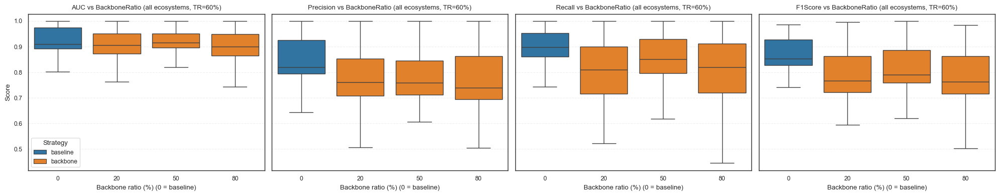

In [1]:
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_context("paper")
sns.set_style("white")

# === Config ===
RESULTS_DIR_BASE = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs/"
RESULTS_DIR_BB   = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_20-50-80/prediction_scores_logs/"
FOODWEB_CSV      = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"

METRICS          = ["AUC", "Precision", "Recall", "F1Score"]
NODES_THRESHOLD  = 40
TARGET_TR        = 60
BACKBONE_RATIOS  = [20, 50, 80]

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    name = "_".join([p for p in name.split("_") if p])
    return name

def normalize_fw_label(name: str) -> str:
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def load_results_dir(results_dir: str) -> pd.DataFrame:
    paths = sorted(glob.glob(os.path.join(results_dir, "*.csv")))
    if not paths:
        raise FileNotFoundError(f"No CSVs under {results_dir}")
    frames = []
    for p in paths:
        try:
            df = pd.read_csv(p)
        except Exception as e:
            print(f"[WARN] Skipping {p}: {e}")
            continue
        df.columns = [c.strip() for c in df.columns]
        upper_map = {c: c.upper() for c in df.columns}
        df = df.rename(columns=upper_map)
        if "FOODWEB" not in df.columns:
            df["FOODWEB"] = derive_foodweb_from_filename(p)
        frames.append(df)
    if not frames:
        raise ValueError(f"No valid CSVs in {results_dir}")
    return pd.concat(frames, ignore_index=True)

# --- Metadata: Foodweb + EcosystemType ---
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col    = [c for c in meta.columns if c.lower() == "foodweb"][0]
nodes_col = [c for c in meta.columns if c.lower() == "nodes"][0]
eco_col   = [c for c in meta.columns if c.lower() in ["ecosystemtype", "ecosystem_type", "ecosystem"]][0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
meta = meta[["FW_KEY", nodes_col, eco_col]]

# =====================================================
# Baseline (no backbone)
# =====================================================
df_base = load_results_dir(RESULTS_DIR_BASE)
df_base["FW_KEY"] = df_base["FOODWEB"].apply(normalize_fw_label)

# Filter by NODES>threshold
df_base = df_base.merge(meta, on="FW_KEY", how="inner")
df_base = df_base[df_base[nodes_col] > NODES_THRESHOLD].copy()

# Normalise TRAINRATIO and keep 60%
tr_candidates = [c for c in df_base.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
tr_col_base   = tr_candidates[0]

df_base["TRAINRATIO"] = pd.to_numeric(df_base[tr_col_base], errors="coerce")
if df_base["TRAINRATIO"].between(0, 1).all():
    df_base["TRAINRATIO"] = (df_base["TRAINRATIO"] * 100).round().astype(int)
else:
    df_base["TRAINRATIO"] = df_base["TRAINRATIO"].astype(int)

df_base = df_base[df_base["TRAINRATIO"] == TARGET_TR].copy()

# Long format for metrics
present = [m for m in METRICS if m.upper() in df_base.columns]
long_frames = []
for m in present:
    mu = m.upper()
    tmp = df_base[["FOODWEB", "FW_KEY", eco_col, "TRAINRATIO", mu]].rename(columns={mu: "Value"})
    tmp["Metric"] = m
    long_frames.append(tmp)
df_long_base = pd.concat(long_frames, ignore_index=True)
df_long_base["Strategy"]      = "baseline"
df_long_base["BACKBONERATIO"] = 0  # encode baseline as BR=0

# Average per foodweb (keep Strategy!)
df_web_means_base = (
    df_long_base
    .groupby(["FOODWEB", "FW_KEY", eco_col, "BACKBONERATIO", "Metric", "Strategy"], as_index=False)["Value"]
    .mean()
)

# =====================================================
# Backbone runs
# =====================================================
df_bb = load_results_dir(RESULTS_DIR_BB)
df_bb["FW_KEY"] = df_bb["FOODWEB"].apply(normalize_fw_label)

df_bb = df_bb.merge(meta, on="FW_KEY", how="inner")
df_bb = df_bb[df_bb[nodes_col] > NODES_THRESHOLD].copy()

# TrainRatio
tr_candidates_bb = [c for c in df_bb.columns if c.lower() in ["trainratio", "ratiotrain", "train_ratio"]]
tr_col_bb = tr_candidates_bb[0]

df_bb["TRAINRATIO"] = pd.to_numeric(df_bb[tr_col_bb], errors="coerce")
if df_bb["TRAINRATIO"].between(0, 1).all():
    df_bb["TRAINRATIO"] = (df_bb["TRAINRATIO"] * 100).round().astype(int)
else:
    df_bb["TRAINRATIO"] = df_bb["TRAINRATIO"].astype(int)

df_bb = df_bb[df_bb["TRAINRATIO"] == TARGET_TR].copy()

# BackboneRatio
bb_candidates = [c for c in df_bb.columns if c.lower() in ["backboneratio", "backbone_ratio"]]
bb_col = bb_candidates[0]

df_bb["BACKBONERATIO"] = pd.to_numeric(df_bb[bb_col], errors="coerce")
if df_bb["BACKBONERATIO"].between(0, 1).all():
    df_bb["BACKBONERATIO"] = (df_bb["BACKBONERATIO"] * 100).round().astype(int)
else:
    df_bb["BACKBONERATIO"] = df_bb["BACKBONERATIO"].astype(int)

df_bb = df_bb[df_bb["BACKBONERATIO"].isin(BACKBONE_RATIOS)].copy()

# Long format
long_frames_bb = []
for m in present:
    mu = m.upper()
    tmp = df_bb[["FOODWEB", "FW_KEY", eco_col, "TRAINRATIO", "BACKBONERATIO", mu]].rename(columns={mu: "Value"})
    tmp["Metric"] = m
    long_frames_bb.append(tmp)
df_long_bb = pd.concat(long_frames_bb, ignore_index=True)
df_long_bb["Strategy"] = "backbone"

df_web_means_bb = (
    df_long_bb
    .groupby(["FOODWEB", "FW_KEY", eco_col, "BACKBONERATIO", "Metric", "Strategy"], as_index=False)["Value"]
    .mean()
)

# =====================================================
# Master table: baseline + backbone
# =====================================================
df_all = pd.concat([df_web_means_base, df_web_means_bb], ignore_index=True)

# Rename ecosystem col to a clean name for later
df_all = df_all.rename(columns={eco_col: "EcosystemType"})

# ---------------------------------------------------------------------
# Multi-metric boxplots: one independent boxplot per metric
# ---------------------------------------------------------------------
metrics_to_plot = present  # already filtered to those that exist
n = len(metrics_to_plot)
n_cols = 4
n_rows = int(np.ceil(n / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharey=True)

# ensure axes is a 2D array
axes = np.array(axes).reshape(n_rows, n_cols)

for i, metric in enumerate(metrics_to_plot):
    r, c = divmod(i, n_cols)
    ax = axes[r, c]

    df_metric = df_all[df_all["Metric"] == metric].copy()

    sns.boxplot(
        data=df_metric,
        x="BACKBONERATIO", y="Value",
        hue="Strategy",           # baseline vs backbone
        showfliers=False,
        ax=ax
    )

    ax.set_xlabel("Backbone ratio (%) (0 = baseline)")
    ax.set_ylabel("Score")
    ax.set_title(f"{metric} vs BackboneRatio (all ecosystems, TR={TARGET_TR}%)")
    ax.grid(True, axis="y", linestyle="--", alpha=0.3)

    # Remove extra legend duplicates, keep only first panel's legend
    if r == 0 and c == 0:
        ax.legend(title="Strategy")
    else:
        ax.get_legend().remove()

# If we have an odd number of metrics, hide any unused subplot
for j in range(i + 1, n_rows * n_cols):
    r, c = divmod(j, n_cols)
    axes[r, c].set_visible(False)

plt.tight_layout()
plt.show()

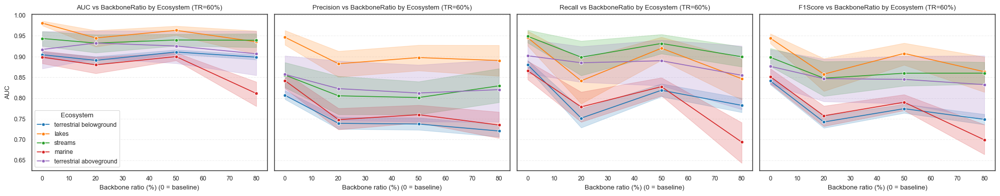

In [2]:
# === Line plots: one panel per metric using df_all ===
metrics_to_plot = sorted(
    df_all["Metric"].unique(),
    key=lambda m: METRICS.index(m) if m in METRICS else 999
)

n = len(metrics_to_plot)
n_cols = 4
n_rows = int(np.ceil(n / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharey=True)
axes = np.array(axes).reshape(n_rows, n_cols)

for i, metric in enumerate(metrics_to_plot):
    r, c = divmod(i, n_cols)
    ax = axes[r, c]

    df_plot = df_all[df_all["Metric"] == metric].copy()

    sns.lineplot(
        data=df_plot,
        x="BACKBONERATIO",
        y="Value",
        hue="EcosystemType",
        marker="o",
        ax=ax
    )

    ax.set_xlabel("Backbone ratio (%) (0 = baseline)")
    ax.set_ylabel(metric)
    ax.set_title(f"{metric} vs BackboneRatio by Ecosystem (TR={TARGET_TR}%)")
    ax.grid(True, axis="y", linestyle="--", alpha=0.3)

    # Only keep legend on the first panel
    if r == 0 and c == 0:
        ax.legend(title="Ecosystem")
    else:
        ax.get_legend().remove()

# Hide any unused subplots if metrics < n_rows * n_cols
for j in range(i + 1, n_rows * n_cols):
    r, c = divmod(j, n_cols)
    axes[r, c].set_visible(False)

plt.tight_layout()
plt.show()

[INFO] Found 290 CSV files. Plotting at most 5.


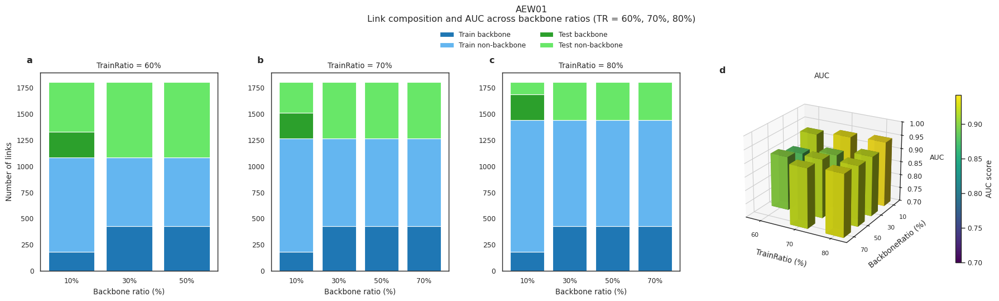

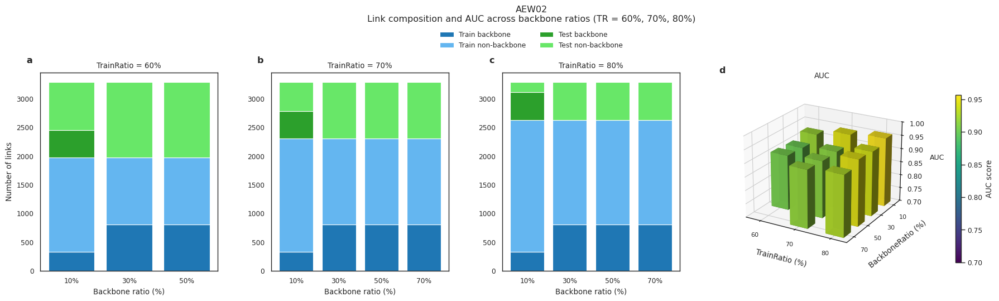

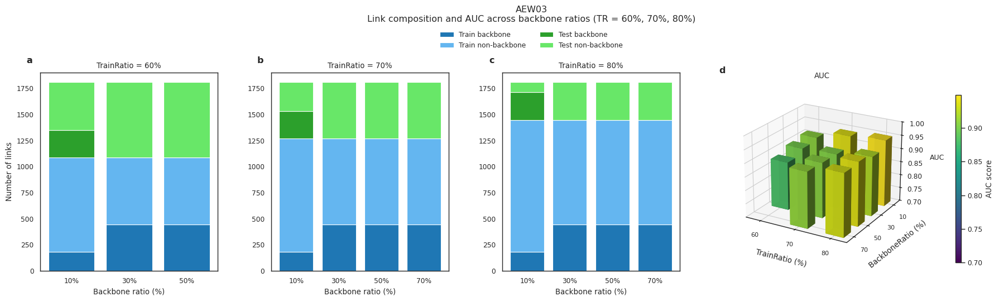

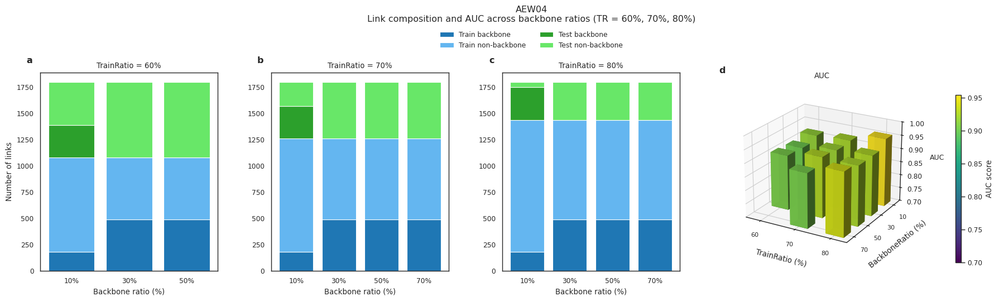

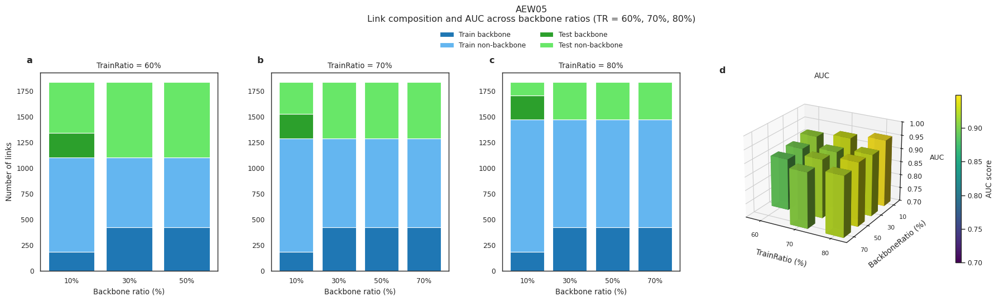

[INFO] Reached plot limit (5). Stopping.


In [1]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D)
from matplotlib import cm, colors

sns.set_context("paper")
sns.set_style("white")

# Optional font config (similar style to your 3D script)
mpl.rcParams["font.family"] = "DejaVu Sans"
mpl.rcParams["font.sans-serif"] = ["DejaVu Sans"]
mpl.rcParams["mathtext.fontset"] = "dejavusans"
mpl.rcParams["axes.unicode_minus"] = False

# === 0. Folder + patterns and limit ===
LOG_DIR = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_10-70/prediction_scores_logs"
GLOB_PATTERNS = [
    "*_results_random.csv",
    "*_results_*.csv",
    "*_result_*.csv",
]
MAX_PLOTS = 5  # avoid flooding VSCode

# Collect files
files = []
for pat in GLOB_PATTERNS:
    files.extend(glob.glob(os.path.join(LOG_DIR, pat)))
files = sorted(set(files))

if not files:
    raise FileNotFoundError(f"No CSV results found in {LOG_DIR}")

print(f"[INFO] Found {len(files)} CSV files. Plotting at most {MAX_PLOTS}.")

# === 1. Config: train ratios and backbone jumps (same for all files) ===
TRAIN_RATIOS = [60, 70, 80]
RB_TARGETS   = [10, 30, 50, 70]

# Optional: fixed colors so all panels look consistent
colors_stacked = {
    "Train backbone":      "#1f77b4",
    "Train non-backbone":  "#64b6f0",
    "Test backbone":       "#2ca02c",
    "Test non-backbone":   "#68e768",
}

# 3D bar appearance
DX = DY = 0.5
FLOOR = 0.7
VIEW_KW = dict(elev=22, azim=-60)

panel_labels = ["a", "b", "c", "d"]   # a–c for stacked, d for 3D

def to_num(s: pd.Series) -> pd.Series:
    """Convert strings like '60', '60%', '0.6' to numeric."""
    return pd.to_numeric(
        s.astype(str).str.replace("%", "", regex=False).str.strip(),
        errors="coerce"
    )

# === 2. Loop over CSV files ===
for idx, PATH in enumerate(files, start=1):
    if idx > MAX_PLOTS:
        print(f"[INFO] Reached plot limit ({MAX_PLOTS}). Stopping.")
        break

    # --- Load CSV ---
    df = pd.read_csv(PATH)

    # Detect which ratio column you have
    if "BackboneRatio" in df.columns:
        ratio_col = "BackboneRatio"
        ratio_label = "Backbone ratio (%)"
    elif "NonBackboneRatio" in df.columns:
        ratio_col = "NonBackboneRatio"
        ratio_label = "Non-backbone ratio (%)"
    else:
        print(f"[WARN] Skipping {PATH}: no BackboneRatio / NonBackboneRatio column.")
        continue

    # Check link-count columns
    group_cols = ["TrainRatio", ratio_col]
    agg_cols = [
        "TotalLinks", "TrainLinks", "TestLinks",
        "BackboneTotal", "NonBackboneTotal",
        "BackboneTrainLinks", "NonBackboneTrainLinks",
        "BackboneTestLinks", "NonBackboneTestLinks",
    ]
    missing_agg = [c for c in agg_cols if c not in df.columns]
    if missing_agg:
        print(f"[WARN] Skipping {PATH}: missing columns {missing_agg}")
        continue

    dfg = df[group_cols + agg_cols].drop_duplicates()

    # === Create subplots row for THIS file ===
    # 3 columns (stacked 2D) + 1 column (3D AUC)
    fig = plt.figure(figsize=(20, 5))
    axes = []
    for i in range(3):
        ax = fig.add_subplot(1, 4, i + 1)
        axes.append(ax)
    ax3d = fig.add_subplot(1, 4, 4, projection="3d")
    axes.append(ax3d)

    # --- 2D STACKED BAR PANELS (a, b, c) ---
    for ax, TR_TARGET, panel in zip(axes[:3], TRAIN_RATIOS, panel_labels[:3]):
        # Filter rows for this TrainRatio and the chosen backbone ratios
        rows = dfg[
            (dfg["TrainRatio"] == TR_TARGET) &
            (dfg[ratio_col].isin(RB_TARGETS))
        ].sort_values(ratio_col)

        if rows.empty:
            ax.set_title(f"TrainRatio = {TR_TARGET}% (no data)")
            ax.set_xticks([])
            continue

        # Prepare stacked data
        x = np.arange(len(rows))
        xtick_labels = [f"{int(r)}%" for r in rows[ratio_col]]

        train_bb = rows["BackboneTrainLinks"].to_numpy()
        train_nb = rows["NonBackboneTrainLinks"].to_numpy()
        test_bb  = rows["BackboneTestLinks"].to_numpy()
        test_nb  = rows["NonBackboneTestLinks"].to_numpy()

        # Stacked bars for this TrainRatio
        ax.bar(
            x, train_bb,
            color=colors_stacked["Train backbone"],
            label="Train backbone"
        )
        ax.bar(
            x, train_nb,
            bottom=train_bb,
            color=colors_stacked["Train non-backbone"],
            label="Train non-backbone"
        )
        ax.bar(
            x, test_bb,
            bottom=train_bb + train_nb,
            color=colors_stacked["Test backbone"],
            label="Test backbone"
        )
        ax.bar(
            x, test_nb,
            bottom=train_bb + train_nb + test_bb,
            color=colors_stacked["Test non-backbone"],
            label="Test non-backbone"
        )

        ax.set_xticks(x)
        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel(ratio_label)
        ax.set_title(f"TrainRatio = {TR_TARGET}%")

        # Bold panel letter, outside top-left (same style you used)
        ax.annotate(
            panel,
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large",
            fontweight="bold",
            annotation_clip=False,
        )

    # Shared y-label on the first subplot
    axes[0].set_ylabel("Number of links")

    # --- 3D PANEL (d): AUC vs TrainRatio × BackboneRatio ---
    added_colorbar = False

    if "AUC" in df.columns:
        df_auc = df.copy()
        df_auc["TR"] = to_num(df_auc["TrainRatio"])
        df_auc["BR"] = to_num(df_auc[ratio_col])

        # Normalize to percentages if needed
        for col in ["TR", "BR"]:
            vals = df_auc[col].dropna()
            if len(vals) and vals.max() <= 1.0:
                df_auc[col] = df_auc[col] * 100

        # Filter to desired TR and BR
        df_auc = df_auc[
            df_auc["TR"].isin(TRAIN_RATIOS) &
            df_auc["BR"].isin(RB_TARGETS)
        ]

        if df_auc.empty:
            ax3d.text2D(
                0.5, 0.5,
                "No AUC data\nfor selected TR/BR",
                transform=ax3d.transAxes,
                ha="center", va="center"
            )
        else:
            # Mean AUC per (TR, BR)
            pivot_auc = (
                df_auc.groupby(["TR", "BR"], as_index=False)["AUC"]
                      .mean()
                      .pivot(index="TR", columns="BR", values="AUC")
                      .reindex(index=TRAIN_RATIOS, columns=RB_TARGETS)
            )

            xr = np.array(TRAIN_RATIOS)
            yr = np.array(RB_TARGETS[::-1])  # descending BR like your 3D script

            # Global color normalization for this panel
            vmax = float(np.nanmax(pivot_auc.values))
            cmap = cm.viridis
            norm = colors.Normalize(vmin=FLOOR, vmax=vmax)

            xs, ys, zs, dzh, cols = [], [], [], [], []

            for i, tr in enumerate(xr):
                for j, br in enumerate(yr):
                    if br not in pivot_auc.columns:
                        continue
                    val = pivot_auc.loc[tr, br]
                    if np.isnan(val):
                        continue
                    height = val - FLOOR
                    if height <= 0:
                        continue
                    xs.append(i - DX / 2)
                    ys.append(j - DY / 2)
                    zs.append(FLOOR)
                    dzh.append(height)
                    cols.append(cmap(norm(val)))

            if xs:
                ax3d.bar3d(xs, ys, zs, DX, DY, dzh,
                           shade=True, color=cols,
                           edgecolor="none", alpha=0.95)

                ax3d.set_title("AUC")
                ax3d.set_xlabel("TrainRatio (%)", labelpad=6)
                ax3d.set_ylabel("BackboneRatio (%)", labelpad=6)
                ax3d.set_zlabel("AUC", labelpad=8, fontsize=9)

                ax3d.set_xticks(range(len(xr)))
                ax3d.set_xticklabels([f"{int(v)}" for v in xr], fontsize=8)
                ax3d.set_yticks(range(len(yr)))
                ax3d.set_yticklabels([f"{int(v)}" for v in yr], fontsize=8)

                ax3d.set_zlim(FLOOR, 1.0)
                ax3d.view_init(**VIEW_KW)

                # ---- Panel letter (d), same style as a–c ----
                ax3d.annotate(
                    panel_labels[3],
                    xy=(0, 1), xycoords="axes fraction",
                    xytext=(-10, 10), textcoords="offset points",
                    ha="right", va="bottom",
                    fontsize="large",
                    fontweight="bold",
                    annotation_clip=False,
                )

                # === Colorbar for AUC (right side) ===
                mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
                mappable.set_array([])
                cbar_ax = fig.add_axes([0.88, 0.18, 0.005, 0.60])
                cb = fig.colorbar(mappable, cax=cbar_ax, aspect=10)
                cb.set_label("AUC score", rotation=90)

    else:
        ax3d.text2D(
            0.5, 0.5,
            "No AUC column\nin this CSV",
            transform=ax3d.transAxes,
            ha="center", va="center"
        )

    # Derive a nice name for the figure title
    base = os.path.splitext(os.path.basename(PATH))[0]
    base = base.replace("_tax_mass_results_random", "").strip(" _")

    # Overall title
    fig.suptitle(
        f"{base}\n"
        "Link composition and AUC across backbone ratios (TR = 60%, 70%, 80%)",
        y=1.1
    )

    # Legend from the last 2D axis (stacked bars) — centered above
    handles, labels = axes[2].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.03),  # a bit above the plot area
        ncol=2,                       # 2 columns like in your example
        frameon=False
    )

    # Use subplots_adjust instead of tight_layout to avoid margin warnings
    fig.subplots_adjust(
        left=0.06,
        right=0.84,   # leave room for colorbar and legend
        bottom=0.15,
        top=0.86,
        wspace=0.30
    )

    plt.show()

[INFO] Found 290 CSV files. Plotting at most 5.


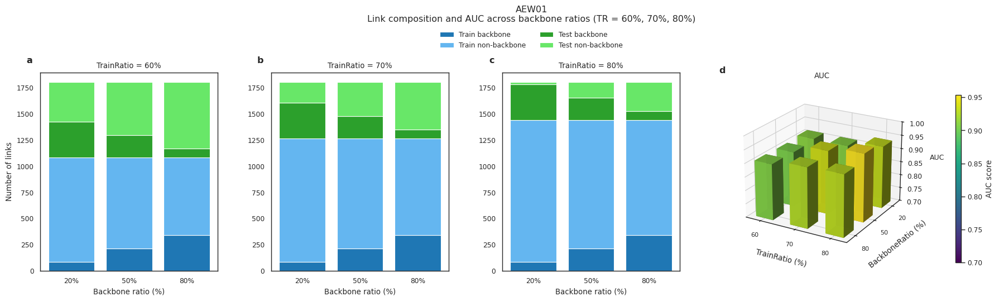

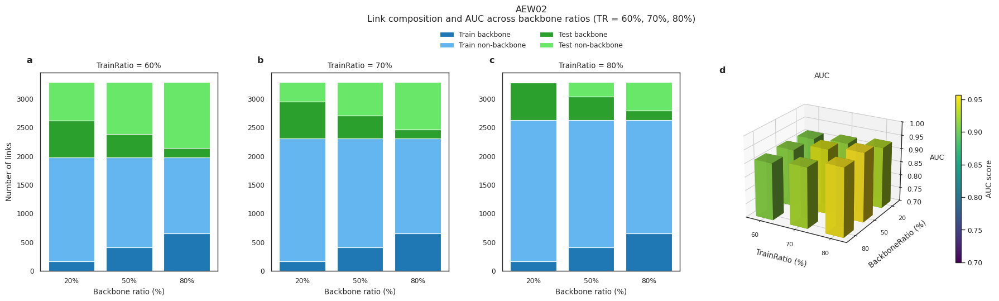

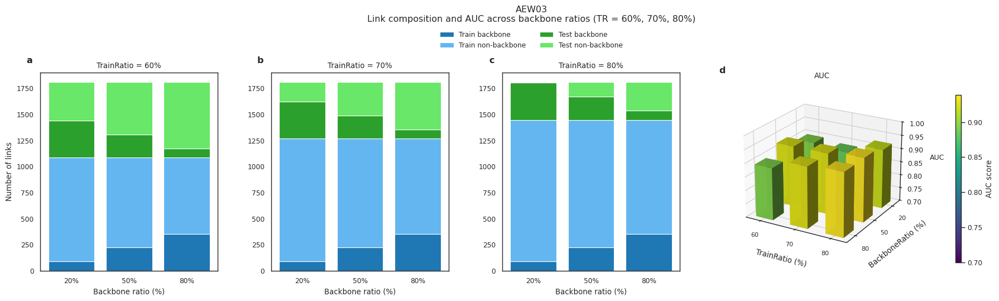

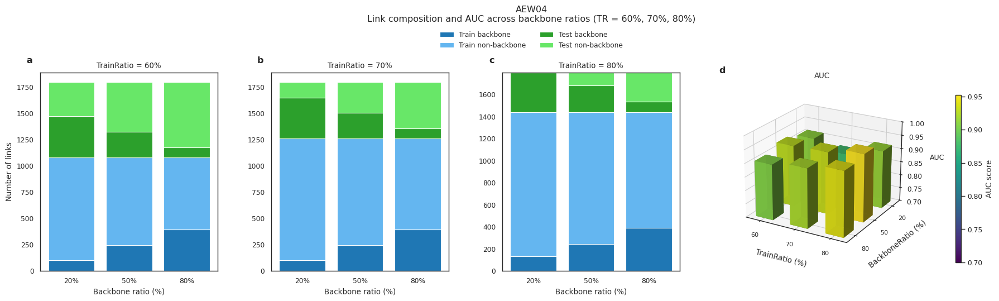

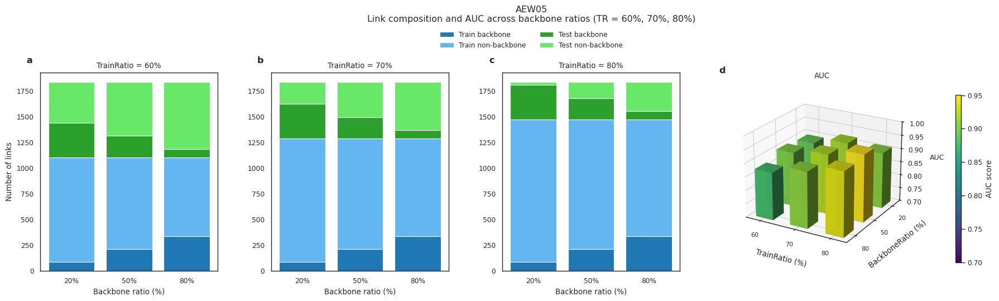

[INFO] Reached plot limit (5). Stopping.


In [2]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D)
from matplotlib import cm, colors

sns.set_context("paper")
sns.set_style("white")

# Optional font config (similar style to your 3D script)
mpl.rcParams["font.family"] = "DejaVu Sans"
mpl.rcParams["font.sans-serif"] = ["DejaVu Sans"]
mpl.rcParams["mathtext.fontset"] = "dejavusans"
mpl.rcParams["axes.unicode_minus"] = False

# === 0. Folder + patterns and limit ===
LOG_DIR = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_20-50-80/"
    "prediction_scores_logs"
)
GLOB_PATTERNS = [
    "*_results_random.csv",
    "*_results_*.csv",
    "*_result_*.csv",
]
MAX_PLOTS = 5  # avoid flooding VSCode

# Collect files
files = []
for pat in GLOB_PATTERNS:
    files.extend(glob.glob(os.path.join(LOG_DIR, pat)))
files = sorted(set(files))

if not files:
    raise FileNotFoundError(f"No CSV results found in {LOG_DIR}")

print(f"[INFO] Found {len(files)} CSV files. Plotting at most {MAX_PLOTS}.")

# === 1. Config: train ratios and backbone ratios (NEW range) ===
TRAIN_RATIOS = [60, 70, 80]
RB_TARGETS   = [20, 50, 80]  # <--- NEW backbone ratio range

# Optional: fixed colors so all panels look consistent
colors_stacked = {
    "Train backbone":      "#1f77b4",
    "Train non-backbone":  "#64b6f0",
    "Test backbone":       "#2ca02c",
    "Test non-backbone":   "#68e768",
}

# 3D bar appearance
DX = DY = 0.5
FLOOR = 0.7
VIEW_KW = dict(elev=22, azim=-60)

panel_labels = ["a", "b", "c", "d"]   # a–c for stacked, d for 3D

def to_num(s: pd.Series) -> pd.Series:
    """Convert strings like '60', '60%', '0.6' to numeric."""
    return pd.to_numeric(
        s.astype(str).str.replace("%", "", regex=False).str.strip(),
        errors="coerce"
    )

# === 2. Loop over CSV files ===
for idx, PATH in enumerate(files, start=1):
    if idx > MAX_PLOTS:
        print(f"[INFO] Reached plot limit ({MAX_PLOTS}). Stopping.")
        break

    # --- Load CSV ---
    df = pd.read_csv(PATH)

    # Detect which ratio column you have
    if "BackboneRatio" in df.columns:
        ratio_col = "BackboneRatio"
        ratio_label = "Backbone ratio (%)"  # semantic changed but label ok
    elif "NonBackboneRatio" in df.columns:
        ratio_col = "NonBackboneRatio"
        ratio_label = "Non-backbone ratio (%)"
    else:
        print(f"[WARN] Skipping {PATH}: no BackboneRatio / NonBackboneRatio column.")
        continue

    # Check link-count columns
    group_cols = ["TrainRatio", ratio_col]
    agg_cols = [
        "TotalLinks", "TrainLinks", "TestLinks",
        "BackboneTotal", "NonBackboneTotal",
        "BackboneTrainLinks", "NonBackboneTrainLinks",
        "BackboneTestLinks", "NonBackboneTestLinks",
    ]
    missing_agg = [c for c in agg_cols if c not in df.columns]
    if missing_agg:
        print(f"[WARN] Skipping {PATH}: missing columns {missing_agg}")
        continue

    dfg = df[group_cols + agg_cols].drop_duplicates()

    # === Create subplots row for THIS file ===
    fig = plt.figure(figsize=(20, 5))
    axes = []
    for i in range(3):
        ax = fig.add_subplot(1, 4, i + 1)
        axes.append(ax)
    ax3d = fig.add_subplot(1, 4, 4, projection="3d")
    axes.append(ax3d)

    # --- 2D STACKED BAR PANELS (a, b, c) ---
    for ax, TR_TARGET, panel in zip(axes[:3], TRAIN_RATIOS, panel_labels[:3]):
        # Filter rows for this TrainRatio and the chosen backbone ratios
        rows = dfg[
            (dfg["TrainRatio"] == TR_TARGET) &
            (dfg[ratio_col].isin(RB_TARGETS))
        ].sort_values(ratio_col)

        if rows.empty:
            ax.set_title(f"TrainRatio = {TR_TARGET}% (no data)")
            ax.set_xticks([])
            continue

        # Prepare stacked data
        x = np.arange(len(rows))
        xtick_labels = [f"{int(r)}%" for r in rows[ratio_col]]

        train_bb = rows["BackboneTrainLinks"].to_numpy()
        train_nb = rows["NonBackboneTrainLinks"].to_numpy()
        test_bb  = rows["BackboneTestLinks"].to_numpy()
        test_nb  = rows["NonBackboneTestLinks"].to_numpy()

        # Stacked bars for this TrainRatio
        ax.bar(
            x, train_bb,
            color=colors_stacked["Train backbone"],
            label="Train backbone"
        )
        ax.bar(
            x, train_nb,
            bottom=train_bb,
            color=colors_stacked["Train non-backbone"],
            label="Train non-backbone"
        )
        ax.bar(
            x, test_bb,
            bottom=train_bb + train_nb,
            color=colors_stacked["Test backbone"],
            label="Test backbone"
        )
        ax.bar(
            x, test_nb,
            bottom=train_bb + train_nb + test_bb,
            color=colors_stacked["Test non-backbone"],
            label="Test non-backbone"
        )

        ax.set_xticks(x)
        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel(ratio_label)
        ax.set_title(f"TrainRatio = {TR_TARGET}%")

        # Bold panel letter
        ax.annotate(
            panel,
            xy=(0, 1), xycoords="axes fraction",
            xytext=(-10, 10), textcoords="offset points",
            ha="right", va="bottom",
            fontsize="large",
            fontweight="bold",
            annotation_clip=False,
        )

    axes[0].set_ylabel("Number of links")

    # --- 3D PANEL (d): AUC vs TrainRatio × BackboneRatio ---
    if "AUC" in df.columns:
        df_auc = df.copy()
        df_auc["TR"] = to_num(df_auc["TrainRatio"])
        df_auc["BR"] = to_num(df_auc[ratio_col])

        # Normalize to percentages if needed
        for col in ["TR", "BR"]:
            vals = df_auc[col].dropna()
            if len(vals) and vals.max() <= 1.0:
                df_auc[col] = df_auc[col] * 100

        df_auc = df_auc[
            df_auc["TR"].isin(TRAIN_RATIOS) &
            df_auc["BR"].isin(RB_TARGETS)
        ]

        if df_auc.empty:
            ax3d.text2D(
                0.5, 0.5,
                "No AUC data\nfor selected TR/BR",
                transform=ax3d.transAxes,
                ha="center", va="center"
            )
        else:
            pivot_auc = (
                df_auc.groupby(["TR", "BR"], as_index=False)["AUC"]
                      .mean()
                      .pivot(index="TR", columns="BR", values="AUC")
                      .reindex(index=TRAIN_RATIOS, columns=RB_TARGETS)
            )

            xr = np.array(TRAIN_RATIOS)
            yr = np.array(RB_TARGETS[::-1])  # descending BR

            vmax = float(np.nanmax(pivot_auc.values))
            cmap = cm.viridis
            norm = colors.Normalize(vmin=FLOOR, vmax=vmax)

            xs, ys, zs, dzh, cols = [], [], [], [], []

            for i, tr in enumerate(xr):
                for j, br in enumerate(yr):
                    if br not in pivot_auc.columns:
                        continue
                    val = pivot_auc.loc[tr, br]
                    if np.isnan(val):
                        continue
                    height = val - FLOOR
                    if height <= 0:
                        continue
                    xs.append(i - DX / 2)
                    ys.append(j - DY / 2)
                    zs.append(FLOOR)
                    dzh.append(height)
                    cols.append(cmap(norm(val)))

            if xs:
                ax3d.bar3d(xs, ys, zs, DX, DY, dzh,
                           shade=True, color=cols,
                           edgecolor="none", alpha=0.95)

                ax3d.set_title("AUC")
                ax3d.set_xlabel("TrainRatio (%)", labelpad=6)
                ax3d.set_ylabel("BackboneRatio (%)", labelpad=6)
                ax3d.set_zlabel("AUC", labelpad=8, fontsize=9)

                ax3d.set_xticks(range(len(xr)))
                ax3d.set_xticklabels([f"{int(v)}" for v in xr], fontsize=8)
                ax3d.set_yticks(range(len(yr)))
                ax3d.set_yticklabels([f"{int(v)}" for v in yr], fontsize=8)

                ax3d.set_zlim(FLOOR, 1.0)
                ax3d.view_init(**VIEW_KW)

                # Panel letter (d)
                ax3d.annotate(
                    panel_labels[3],
                    xy=(0, 1), xycoords="axes fraction",
                    xytext=(-10, 10), textcoords="offset points",
                    ha="right", va="bottom",
                    fontsize="large",
                    fontweight="bold",
                    annotation_clip=False,
                )

                # Colorbar
                mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
                mappable.set_array([])
                cbar_ax = fig.add_axes([0.88, 0.18, 0.005, 0.60])
                cb = fig.colorbar(mappable, cax=cbar_ax, aspect=10)
                cb.set_label("AUC score", rotation=90)
    else:
        ax3d.text2D(
            0.5, 0.5,
            "No AUC column\nin this CSV",
            transform=ax3d.transAxes,
            ha="center", va="center"
        )

    base = os.path.splitext(os.path.basename(PATH))[0]
    base = base.replace("_tax_mass_results_random", "").strip(" _")

    fig.suptitle(
        f"{base}\n"
        "Link composition and AUC across backbone ratios (TR = 60%, 70%, 80%)",
        y=1.1
    )

    handles, labels = axes[2].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.03),
        ncol=2,
        frameon=False
    )

    fig.subplots_adjust(
        left=0.06,
        right=0.84,
        bottom=0.15,
        top=0.86,
        wspace=0.30
    )

    plt.show()

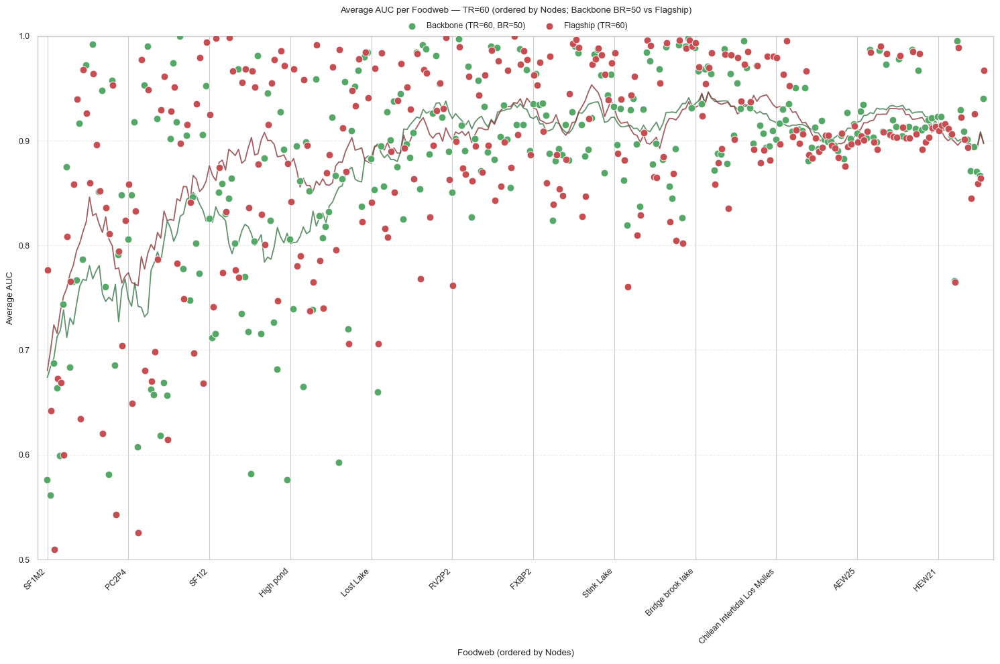

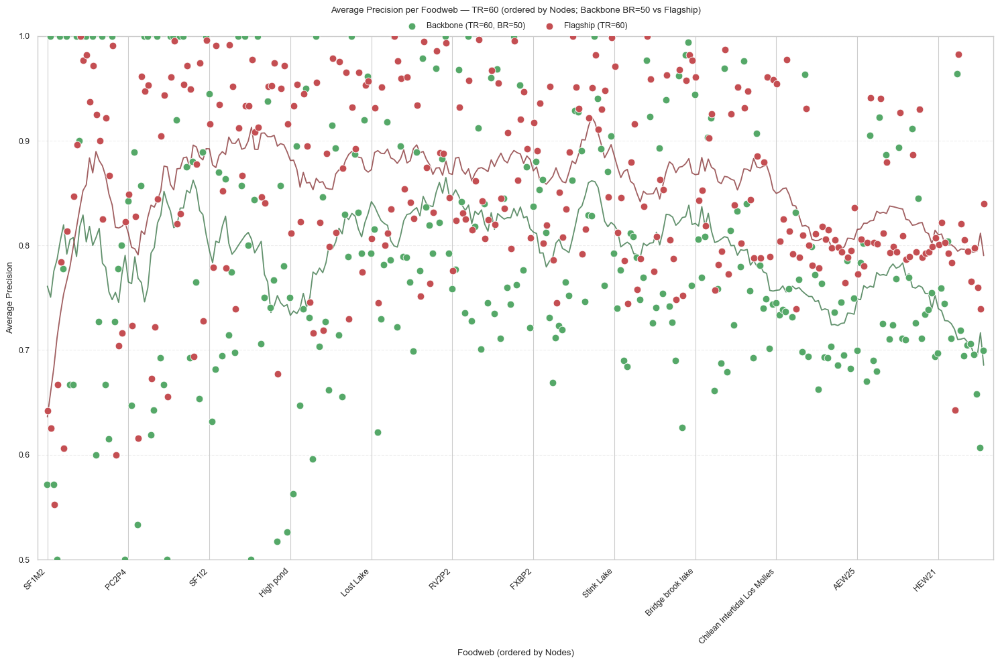

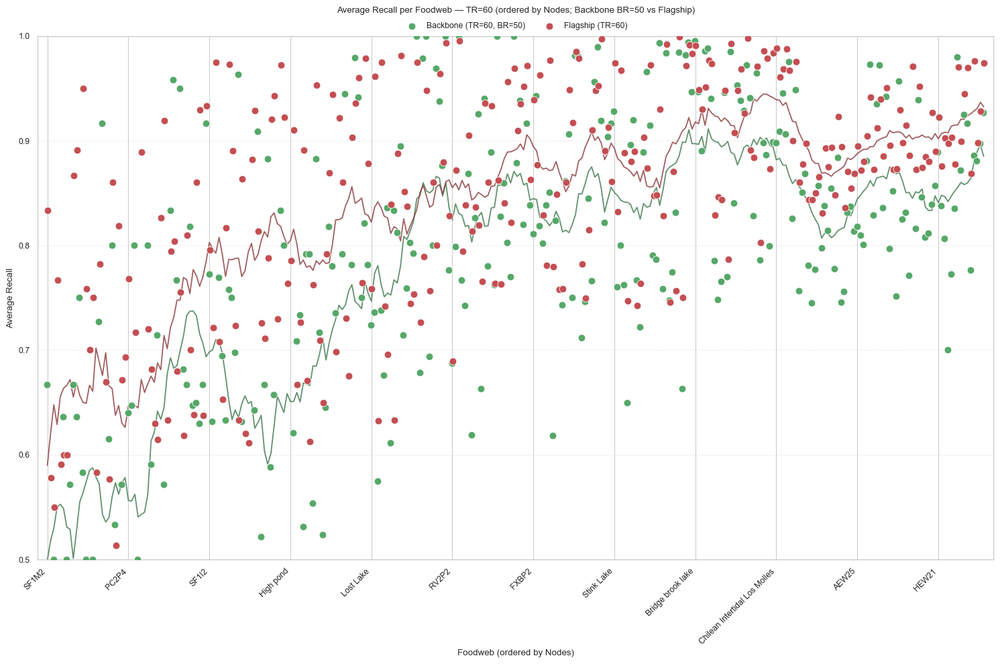

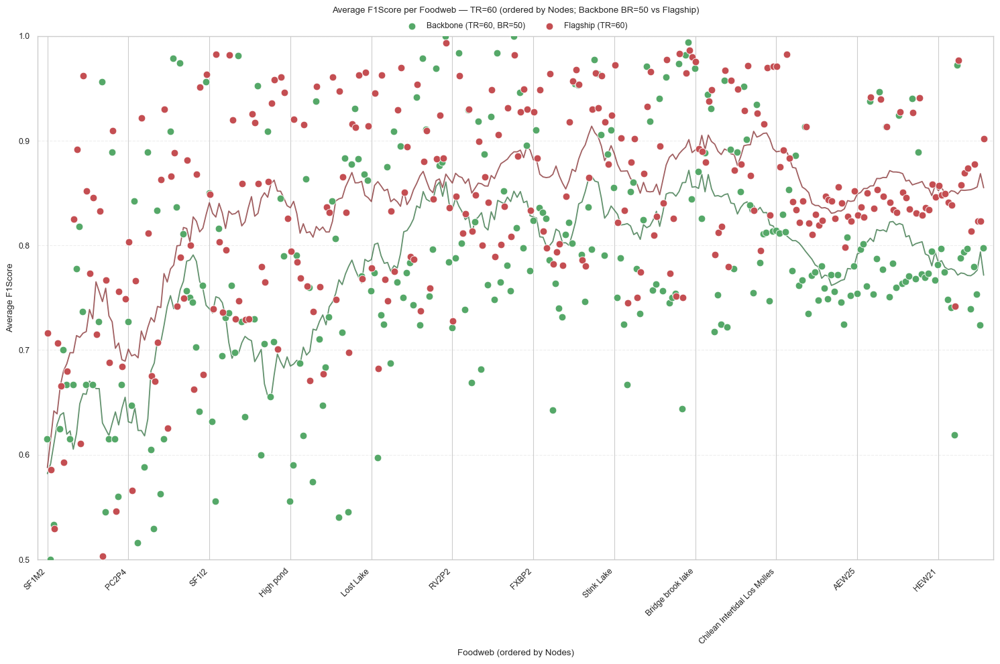

In [1]:
# %% AUC/Precision/Recall/F1Score average by foodweb (overlay two sources) — TR=80
import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors  # ← for darkening colors

RESULTS_DIR_BACKBONE = "../../src/matlab/data/result_sweep_trainRatio_60-80_backboneRatio_20-50-80/prediction_scores_logs"
RESULTS_DIR_FLAGSHIP = "../../src/matlab/data/result_sweep_train_ratios_290/prediction_scores_logs"
ECOSYSTEM_META_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]

TRAIN_RATIO_TARGET = 60
BACKBONE_RATIO_TARGET = 50  # only for the BACKBONE series

sns.set_theme(style="whitegrid", context="paper")

def derive_foodweb_from_filename(path: str) -> str:
    base = os.path.basename(path)
    name, _ = os.path.splitext(base)
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    return "_".join([p for p in name.split("_") if p])

def sanitize_fw(name: str) -> str:
    n = os.path.splitext(os.path.basename(str(name)))[0]
    for token in ["_results_", "_result_", "_results", "_random", "_tax_mass", "_tax", "_mass"]:
        n = n.replace(token, "_")
    n = "_".join([p for p in n.split("_") if p])
    return n.lower()

def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")

def load_metric_means(results_dir, tr_target, br_target=None):
    files = []
    for pat in GLOB_PATTERNS:
        files.extend(glob.glob(os.path.join(results_dir, pat)))
    files = sorted(set(files))

    rows = []
    for path in files:
        try:
            df = pd.read_csv(path)
        except Exception:
            continue

        try:
            metric_col = pick_col(df.columns, [METRIC])
        except KeyError:
            continue

        bb  = next((c for c in ["BackboneRatio","Backbone_Ratio","Backbone","b_ratio"] if c in df.columns), None)
        tr  = next((c for c in ["TrainRatio","Train_Ratio","train_ratio"] if c in df.columns), None)
        if tr is None:
            continue

        df[metric_col] = pd.to_numeric(df[metric_col], errors="coerce")
        df[tr]  = pd.to_numeric(df[tr], errors="coerce")
        if bb is not None:
            df[bb] = pd.to_numeric(df[bb], errors="coerce")

        df["_TR"] = (df[tr]*100).round().astype(int) if df[tr].dropna().between(0,1).all() else df[tr].round().astype(int)

        if br_target is not None:
            if bb is None:
                continue
            df["_BR"] = (df[bb]*100).round().astype(int) if df[bb].dropna().between(0,1).all() else df[bb].round().astype(int)
            dff = df[(df["_TR"] == tr_target) & (df["_BR"] == br_target)].copy()
        else:
            dff = df[(df["_TR"] == tr_target)].copy()

        if dff.empty:
            continue

        rows.append({"Foodweb": derive_foodweb_from_filename(path), f"{METRIC}_mean": dff[metric_col].mean(skipna=True)})

    return pd.DataFrame(rows)

def darken(color, amount=0.7):
    r, g, b = mcolors.to_rgb(color)
    return tuple((amount*np.array([r, g, b])).clip(0, 1))

# === Loop over all metrics with identical plotting logic ===
for METRIC in ["AUC", "Precision", "Recall", "F1Score"]:
    # Load both series for this METRIC
    df_backbone = load_metric_means(RESULTS_DIR_BACKBONE, TRAIN_RATIO_TARGET, BACKBONE_RATIO_TARGET)
    df_flagship = load_metric_means(RESULTS_DIR_FLAGSHIP, TRAIN_RATIO_TARGET, br_target=None)

    if df_backbone.empty and df_flagship.empty:
        print(f"[Info] No matching rows for metric {METRIC}. Skipping.")
        continue

    # Merge, keep all foodwebs from both
    merged = pd.merge(
        df_backbone.rename(columns={f"{METRIC}_mean":f"{METRIC}_backbone"}),
        df_flagship.rename(columns={f"{METRIC}_mean":f"{METRIC}_flagship"}),
        on="Foodweb", how="outer"
    )

    # Load metadata and sort by Nodes (ascending)
    meta = pd.read_csv(ECOSYSTEM_META_CSV)
    fw_col    = pick_col(meta.columns, ["Foodweb","FoodWeb","foodweb","Network"])
    nodes_col = pick_col(meta.columns, ["Nodes","N","NumNodes","num_nodes","#Nodes","S"])

    meta2 = meta[[fw_col, nodes_col]].rename(columns={fw_col:"Foodweb_meta", nodes_col:"Nodes"}).copy()
    meta2["Foodweb_key"] = meta2["Foodweb_meta"].astype(str).map(sanitize_fw)

    merged["Foodweb_key"] = merged["Foodweb"].astype(str).map(sanitize_fw)
    merged = merged.merge(meta2[["Foodweb_key","Nodes"]], on="Foodweb_key", how="left")
    merged["Nodes_num"] = pd.to_numeric(merged["Nodes"], errors="coerce")

    if merged["Nodes_num"].notna().any():
        merged = merged.sort_values("Nodes_num", ascending=True).reset_index(drop=True)
    else:
        sort_val = merged.get(f"{METRIC}_flagship", pd.Series(index=merged.index)).fillna(
            merged.get(f"{METRIC}_backbone", pd.Series(index=merged.index))
        )
        merged = merged.assign(_sort=sort_val).sort_values("_sort", ascending=True).drop(columns=["_sort"]).reset_index(drop=True)

    # Plotting positions and thinned labels
    x = np.arange(len(merged))
    labels = merged["Foodweb"].tolist()
    step = max(1, int(np.ceil(len(labels) / 12)))
    tick_idx = list(range(0, len(labels), step))

    plt.figure(figsize=(15, 10))
    ax = plt.gca()

    # Scatter series (points)
    ax.scatter(x - 0.12, merged.get(f"{METRIC}_backbone"), s=60,
               label=f"Backbone (TR={TRAIN_RATIO_TARGET}, BR={BACKBONE_RATIO_TARGET})",
               color="C2", edgecolors="white", linewidths=0.6, zorder=3)
    ax.scatter(x + 0.12, merged.get(f"{METRIC}_flagship"), s=60,
               label=f"Flagship (TR={TRAIN_RATIO_TARGET})",
               color="C3", edgecolors="white", linewidths=0.6, zorder=3)

    # Trend lines (slightly darker than points)
    window = max(5, int(np.ceil(len(merged) * 0.05)))
    trend_backbone = darken("C2", amount=0.7)
    trend_flagship = darken("C3", amount=0.7)

    y_b = merged.get(f"{METRIC}_backbone").to_numpy(dtype=float)
    mask_b = ~np.isnan(y_b)
    if mask_b.any():
        yb_smooth = pd.Series(y_b[mask_b]).rolling(window=window, center=True, min_periods=1).mean().to_numpy()
        ax.plot(x[mask_b], yb_smooth, color=trend_backbone, alpha=0.8, linewidth=1.3, zorder=2)

    y_f = merged.get(f"{METRIC}_flagship").to_numpy(dtype=float)
    mask_f = ~np.isnan(y_f)
    if mask_f.any():
        yf_smooth = pd.Series(y_f[mask_f]).rolling(window=window, center=True, min_periods=1).mean().to_numpy()
        ax.plot(x[mask_f], yf_smooth, color=trend_flagship, alpha=0.8, linewidth=1.3, zorder=2)

    # Axes & grid
    ax.set_xticks(tick_idx)
    ax.set_xticklabels([labels[i] for i in tick_idx], rotation=45, ha="right")
    ax.set_ylim(0.5, 1.0)  # keep same logic/scale
    ax.set_xlabel("Foodweb (ordered by Nodes)")
    ax.set_ylabel(f"Average {METRIC}")
    ax.set_title(
        f"Average {METRIC} per Foodweb — TR={TRAIN_RATIO_TARGET} (ordered by Nodes; Backbone BR={BACKBONE_RATIO_TARGET} vs Flagship)",
        pad=25
    )
    ax.grid(True, axis="y", linestyle="--", alpha=0.35)
    ax.margins(x=0.01)

    # Legend centered above
    ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.04), ncol=2, frameon=False)

    plt.tight_layout()
    plt.show()

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


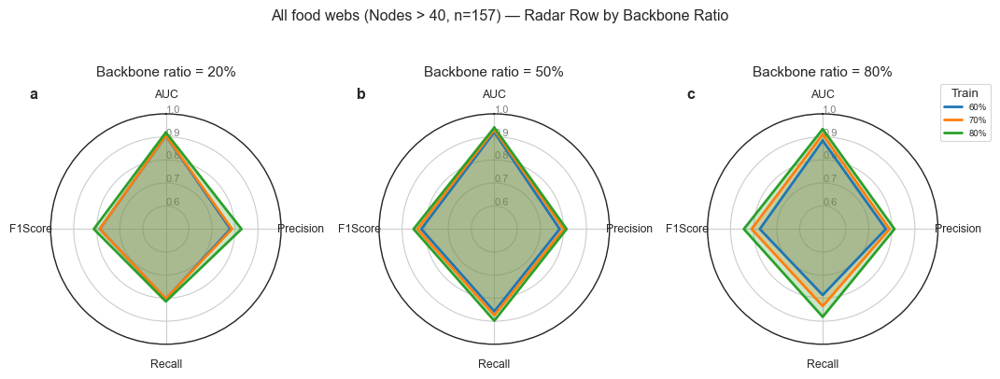

In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
import seaborn as sns  # ← styling

sns.set_context("paper")
sns.set_style("white")

# ========= Config =========
# Now pointing to the BACKBONE ratio sweep (20, 50, 80)
INPUT_DIR = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_20-50-80/"
    "prediction_scores_logs"
)
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = [
    "*_results_random.csv",
    "*_results_*.csv",
    "*_result_*.csv",
]

metrics = ["AUC", "Precision", "Recall", "F1Score"]
train_ratios = [60, 70, 80]
colors = {60: "C0", 70: "C1", 80: "C2"}
alpha_fill = 0.25
MAX_SHOW = None  # show at most N files (set None to use all)
NODES_THRESHOLD = 40

# New: backbone-ratio targets to show as columns
RB_TARGETS = [20, 50, 80]

# ========= Helpers =========
def normalize_train_ratio(x):
    """Return ratio as percentage in [0..100] (accept 0.8 or 80)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)


def normalize_rb_ratio(x):
    """Return backbone/non-backbone ratio as percentage in [0..100] (accept 0.2 or 20)."""
    try:
        x = float(x)
    except Exception:
        return np.nan
    return round(x if x > 1 else x * 100, 0)


def compute_angles(labels):
    """Angles for radar chart and closed loop."""
    N = len(labels)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    return angles


def pick_col(cols, candidates):
    cols_lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    raise KeyError(f"None of {candidates} found among: {list(cols)}")


def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)   # remove .mat/.csv/etc.
    name = name.replace(" ", "_")
    for token in [
        "_results_",
        "_result_",
        "_results",
        "_random",
        "_tax_mass",
        "_tax",
        "_mass",
    ]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)


def plot_radar_row(df, title):
    """
    Draw a row of radars, one per ratio in RB_TARGETS.
    Each radar shows series for the configured train_ratios.
    df is already filtered (Nodes > threshold) and may contain many foodwebs.
    """
    # --- Find columns (robust names) ---
    try:
        tr_col = pick_col(df.columns, ["TrainRatio", "Train_Ratio", "train_ratio"])
    except KeyError:
        print(f"[Warn] Missing TrainRatio column in '{title}', skipping.")
        return

    # Try BackboneRatio first, then NonBackboneRatio for compatibility
    try:
        rb_col = pick_col(df.columns, ["BackboneRatio", "NonBackboneRatio"])
    except KeyError:
        print(f"[Warn] Missing BackboneRatio/NonBackboneRatio column in '{title}', skipping.")
        return

    # Label for titles depending on which column we found
    rb_label = "Backbone" if rb_col.lower().startswith("backbone") else "Non-backbone"

    # Normalize TR and ratio to integer percentages
    df = df.copy()
    df["_TrainRatioPct"] = df[tr_col].apply(normalize_train_ratio)
    df["_RB_Pct"] = df[rb_col].apply(normalize_rb_ratio)

    angles = compute_angles(metrics)

    # Dynamic number of columns based on RB_TARGETS
    n_targets = len(RB_TARGETS)
    fig_width = 3.6 * n_targets  # ~3.6 per panel
    fig, axes = plt.subplots(
        1,
        n_targets,
        figsize=(fig_width, 3.8),
        subplot_kw=dict(polar=True),
    )

    if n_targets == 1:
        axes = [axes]

    # Panel letters: a, b, c, ...
    letters = [chr(ord("a") + k) for k in range(n_targets)]

    for j, (ax, rb, letter) in enumerate(zip(axes, RB_TARGETS, letters)):
        dff = df[df["_RB_Pct"] == rb]

        # Radar layout
        ax.set_theta_offset(pi / 2)
        ax.set_theta_direction(-1)
        ax.set_thetagrids([a * 180 / pi for a in angles[:-1]], metrics)
        ax.set_rlabel_position(0)

        # Zoom upper half
        ax.set_ylim(0.5, 1.0)
        ax.set_yticks([0.6, 0.7, 0.8, 0.9, 1.0])
        ax.set_yticklabels(["0.6", "0.7", "0.8", "0.9", "1.0"], color="gray", size=8)

        # Draw each TrainRatio series for this ratio
        for ratio in train_ratios:
            subset = dff[dff["_TrainRatioPct"] == ratio]
            if subset.empty and "TrainRatio" in dff.columns:
                subset = dff[dff["TrainRatio"] == ratio]  # fallback if not normalized
            if subset.empty:
                continue

            # Global mean summarisation over all filtered foodwebs
            summary = subset[metrics].astype(float).mean()
            values = summary.tolist()
            values += values[:1]

            ax.plot(
                angles,
                values,
                linewidth=2,
                color=colors.get(ratio, "C7"),
                label=f"{int(ratio)}%",
            )
            ax.fill(
                angles,
                values,
                color=colors.get(ratio, "C7"),
                alpha=alpha_fill,
            )

        # Bold panel letter
        ax.annotate(
            letter,
            xy=(0, 1),
            xycoords="axes fraction",
            xytext=(-10, 10),
            textcoords="offset points",
            ha="right",
            va="bottom",
            fontsize="large",
            fontweight="bold",
            annotation_clip=False,
        )

        ax.set_title(f"{rb_label} ratio = {rb}%", va="bottom", pad=8, fontsize=11)

        # Only one legend on the last subplot
        if j == n_targets - 1:
            from matplotlib.lines import Line2D

            handles = [
                Line2D([0], [0], color=colors.get(r, "C7"), lw=2)
                for r in train_ratios
            ]
            labels = [f"{int(r)}%" for r in train_ratios]

            ax.legend(
                handles,
                labels,
                loc="upper right",
                bbox_to_anchor=(1.25, 1.15),
                fontsize=7,
                title="Train",
            )

    fig.suptitle(f"{title} — Radar Row by {rb_label} Ratio", y=1.05)
    plt.tight_layout()
    plt.show()


# ========= Collect files =========
files = []
for pat in GLOB_PATTERNS:
    files.extend(glob.glob(os.path.join(INPUT_DIR, pat)))
files = sorted(set(files))

if not files:
    raise FileNotFoundError(f"No CSV files found in: {INPUT_DIR}")

# ========= Load foodweb metadata and compute allowed FW keys =========
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError("Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV.")

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(
    f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: "
    f"{len(allowed_fw_keys)}"
)

# ========= Read and stack all allowed files =========
frames = []
used_files = 0

for csv_path in files:
    if MAX_SHOW is not None and used_files >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    foodweb_name = os.path.splitext(os.path.basename(csv_path))[0]
    fw_key = normalize_fw_label(foodweb_name)

    # Skip foodwebs below threshold
    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(csv_path)
    except Exception as e:
        print(f"[Warn] Could not read '{csv_path}': {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    df["FOODWEB"] = fw_key

    frames.append(df)
    used_files += 1

if not frames:
    raise ValueError(
        f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}."
    )

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = df_all["FOODWEB"].nunique()
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# ========= Single global radar row (mean over filtered foodwebs) =========
plot_title = f"All food webs (Nodes > {NODES_THRESHOLD}, n={n_foodwebs})"
plot_radar_row(df_all, plot_title)

[INFO] Foodwebs with Nodes > 40 in metadata: 157
[INFO] Foodwebs in results AFTER filter: 157


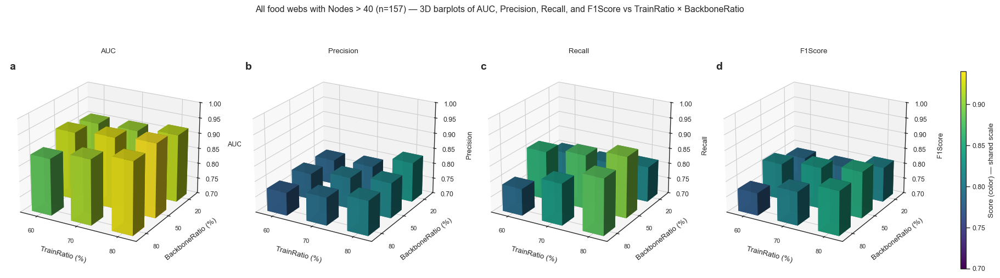

In [2]:
# %% 1x4 3D Barplots over multiple foodweb CSVs (global mean over foodwebs with Nodes > 40)
import os, glob
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm, colors
import seaborn as sns

# Font setup to avoid Unicode glyph issues
mpl.rcParams["font.family"] = "DejaVu Sans"
mpl.rcParams["font.sans-serif"] = ["DejaVu Sans"]
mpl.rcParams["mathtext.fontset"] = "dejavusans"
mpl.rcParams["axes.unicode_minus"] = False

# === Config ===
RESULTS_DIR = (
    "../../src/matlab/data/"
    "result_sweep_trainRatio_60-80_backboneRatio_20-50-80/"
    "prediction_scores_logs"
)
FOODWEB_CSV = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_ecosystem.csv"
GLOB_PATTERNS = ["*_results_random.csv", "*_results_*.csv", "*_result_*.csv"]
MAX_SHOW = None          # max number of foodweb files to include (None = all)
NODES_THRESHOLD = 40

DX = DY = 0.5        # bar thickness
FLOOR = 0.7          # common floor for all metrics
VIEW_KW = dict(elev=22, azim=-60)  # common 3D view

def normalize_fw_label(name: str) -> str:
    """
    Normaliza etiquetas de foodweb para compararlas entre filenames y FOODWEB_CSV.
    """
    name = str(name).strip()
    name, _ = os.path.splitext(name)
    name = name.replace(" ", "_")
    for token in ["_results_", "_result_", "_results", "_random",
                  "_tax_mass", "_tax", "_mass"]:
        name = name.replace(token, "_")
    parts = [p for p in name.split("_") if p]
    return "_".join(parts)

def pick_column(df: pd.DataFrame, *opts) -> str:
    norm_names = {
        c.lower().replace(" ", "").replace("_", ""): c for c in df.columns
    }
    for o in opts:
        k = o.lower().replace("_", "")
        if k in norm_names:
            return norm_names[k]
    raise KeyError(f"None of {opts} found in columns: {list(df.columns)}")

def to_num(s: pd.Series) -> pd.Series:
    return pd.to_numeric(
        s.astype(str).str.replace("%", "", regex=False).str.strip(),
        errors="coerce"
    )

def plot_global_3d(df: pd.DataFrame, title: str):
    """
    1x4 3D barplot (AUC, Precision, Recall, F1Score) vs TrainRatio × BR,
    using all (TR, BR) combinations present in the results.
    """
    # --- Robustly pick TrainRatio and Backbone/NonBackbone ratio columns ---
    train_col = pick_column(df, "TrainRatio", "train_ratio", "trainratio", "train")

    # Accept BackboneRatio (new runs) or NonBackboneRatio (inverse runs)
    rb_col = pick_column(
        df,
        "BackboneRatio", "backbone_ratio", "backboneratio", "backbone",
        "NonBackboneRatio", "nonbackboneratio", "non_backbone_ratio"
    )

    # Detect label for Y axis / title
    rb_is_backbone = rb_col.lower().startswith("backbone")
    rb_label = "BackboneRatio" if rb_is_backbone else "NonBackboneRatio"

    df = df.copy()
    df[train_col] = to_num(df[train_col])
    df[rb_col]    = to_num(df[rb_col])

    # Ensure X/Y are in 0–100 (percent)
    for c in [train_col, rb_col]:
        vals = df[c].dropna()
        if len(vals) and vals.max() <= 1.0:
            df[c] = df[c] * 100

    # NOTE: we NO LONGER drop rows where BR > TR.
    # This allows us to see (TR=60, BR=80) and (TR=70, BR=80) combos.

    # Metric columns with flexible aliases
    metric_aliases = {
        "AUC":       ("AUC", "auc"),
        "Precision": ("Precision", "precision", "prec"),
        "Recall":    ("Recall", "recall", "tpr", "sensitivity"),
        "F1Score":   ("F1Score", "f1score", "f1_score", "f1"),
    }
    metric_cols = {m: pick_column(df, *aliases) for m, aliases in metric_aliases.items()}

    # X/Y grid from data; Y (ratio) descending
    xr = np.sort(df[train_col].dropna().unique())
    yr = np.sort(df[rb_col].dropna().unique())[::-1]

    # Build metric grids (global mean over all included foodwebs)
    grids = {}
    for m, col in metric_cols.items():
        tmp = (
            df.groupby([train_col, rb_col], as_index=False)[col]
              .mean()
              .rename(columns={col: "val"})
        )
        grid = (
            tmp.pivot(index=train_col, columns=rb_col, values="val")
               .reindex(index=xr, columns=yr)
        )
        grids[m] = grid

    # Global normalization for shared colorbar
    vmax_global = max(float(np.nanmax(g.values)) for g in grids.values())
    cmap = cm.viridis
    norm = colors.Normalize(vmin=FLOOR, vmax=vmax_global)

    # === Plot 1x4 ===
    sns.set_theme(style="ticks", context="paper")
    fig = plt.figure(figsize=(20, 6))
    axes = [fig.add_subplot(1, 4, i+1, projection="3d") for i in range(4)]

    for ax, (metric_name, grid) in zip(axes, grids.items()):
        xs, ys, zs, dzh, cols = [], [], [], [], []
        for i, tr in enumerate(xr):
            for j, br in enumerate(yr):
                val = grid.iloc[i, j]
                if np.isnan(val):
                    continue
                height = val - FLOOR
                if height <= 0:
                    continue
                xs.append(i - DX/2)
                ys.append(j - DY/2)
                zs.append(FLOOR)
                dzh.append(height)
                cols.append(cmap(norm(val)))

        ax.bar3d(
            xs, ys, zs,
            DX, DY, dzh,
            shade=True, color=cols,
            edgecolor="none", alpha=0.95
        )

        ax.set_title(metric_name)
        ax.set_xlabel("TrainRatio (%)", labelpad=6)
        ax.set_ylabel(f"{rb_label} (%)", labelpad=6)
        ax.set_zlabel(metric_name, labelpad=8, fontsize=9)

        ax.set_xticks(range(len(xr)))
        ax.set_xticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in xr],
            fontsize=8
        )
        ax.set_yticks(range(len(yr)))
        ax.set_yticklabels(
            [f"{int(v):d}" if float(v).is_integer() else f"{v:g}" for v in yr],
            fontsize=8
        )

        ax.set_zlim(FLOOR, 1.0)
        ax.view_init(**VIEW_KW)

    # Panel letters
    panel_labels = ["a", "b", "c", "d"]
    for ax, lab in zip(axes, panel_labels):
        ax.text2D(
            0.02, 0.98, lab,
            transform=ax.transAxes,
            ha="left", va="top",
            fontweight="bold", fontsize=14
        )

    # Shared colorbar
    mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])
    cbar_ax = fig.add_axes([0.92, 0.18, 0.005, 0.60])
    cb = plt.colorbar(mappable, cax=cbar_ax, aspect=30)
    cb.set_label("Score (color) — shared scale")

    fig.suptitle(
        f"{title} — 3D barplots of AUC, Precision, Recall, and F1Score "
        f"vs TrainRatio × {rb_label}",
        y=0.98
    )

    plt.subplots_adjust(
        left=0.05, right=0.88,
        bottom=0.12, top=0.90,
        wspace=0.15
    )
    plt.show()

# === Discover CSVs ===
all_files = []
for pat in GLOB_PATTERNS:
    all_files.extend(glob.glob(os.path.join(RESULTS_DIR, pat)))
all_files = sorted(set(all_files))
if not all_files:
    raise FileNotFoundError(
        f"No CSVs found in {RESULTS_DIR} with patterns {GLOB_PATTERNS}"
    )

# === Load foodweb metadata & compute allowed keys (Nodes > threshold) ===
meta = pd.read_csv(FOODWEB_CSV)
meta.columns = [c.strip() for c in meta.columns]

fw_col_candidates = [c for c in meta.columns if c.lower() == "foodweb"]
nodes_col_candidates = [c for c in meta.columns if c.lower() == "nodes"]
if not fw_col_candidates or not nodes_col_candidates:
    raise ValueError(
        "Could not find 'Foodweb' and 'Nodes' columns in FOODWEB_CSV."
    )

fw_col = fw_col_candidates[0]
nodes_col = nodes_col_candidates[0]

meta["FW_KEY"] = meta[fw_col].apply(normalize_fw_label)
allowed_fw_keys = set(
    meta.loc[meta[nodes_col] > NODES_THRESHOLD, "FW_KEY"].unique()
)

print(
    f"[INFO] Foodwebs with Nodes > {NODES_THRESHOLD} in metadata: "
    f"{len(allowed_fw_keys)}"
)

# === Read & stack only allowed foodweb CSVs ===
frames = []
included_keys = set()

for fp in all_files:
    if MAX_SHOW is not None and len(included_keys) >= MAX_SHOW:
        print(f"[Info] Reached file limit ({MAX_SHOW}). Skipping remaining files.")
        break

    fw_name_raw = os.path.splitext(os.path.basename(fp))[0]
    fw_key = normalize_fw_label(fw_name_raw)

    if fw_key not in allowed_fw_keys:
        continue

    try:
        df = pd.read_csv(fp)
    except Exception as e:
        print(f"[Skip] {fp}: {e}")
        continue

    df.columns = [c.strip() for c in df.columns]
    df["FOODWEB"] = fw_key
    frames.append(df)
    included_keys.add(fw_key)

if not frames:
    raise ValueError(
        f"No valid CSVs for foodwebs with Nodes > {NODES_THRESHOLD}."
    )

df_all = pd.concat(frames, ignore_index=True)
n_foodwebs = len(included_keys)
print(f"[INFO] Foodwebs in results AFTER filter: {n_foodwebs}")

# === Single global 3D plot (mean over all filtered foodwebs) ===
global_title = f"All food webs with Nodes > {NODES_THRESHOLD} (n={n_foodwebs})"
plot_global_3d(df_all, global_title)

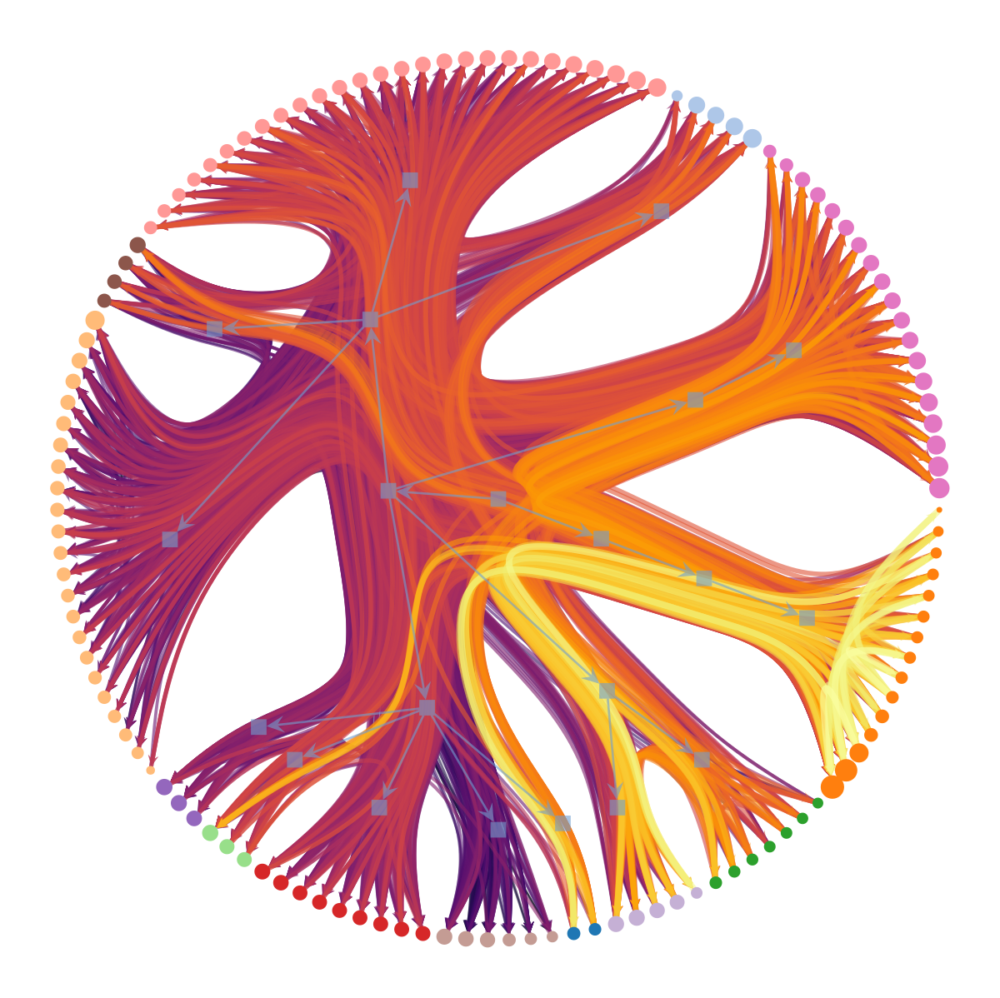

In [ ]:
import graph_tool.all as gt
import matplotlib.cm

gt.seed_rng(47)

g = gt.collection.ns["foodweb_baywet"]

sargs = dict(recs=[g.ep.weight], rec_types=["real-exponential"])
state = gt.minimize_nested_blockmodel_dl(g, state_args=sargs)

state.draw(
    edge_color=gt.prop_to_size(g.ep.weight, power=1, log=True),
    ecmap=(matplotlib.cm.inferno, .6),
    eorder=g.ep.weight,
    edge_pen_width=gt.prop_to_size(g.ep.weight, 1, 4, power=1, log=True),
    edge_gradient=[]
);

Foodweb Kongsfjorden_tax_mass: 1603 edges in full net (278 backbone edges)


/var/folders/37/n26ttb4n16xb2c3z17l2p6r00000gp/T/ipykernel_1165/1357272898.py:78: RuntimeWarning: invalid value encountered in log10
  logm = np.log10(masses + 1e-8)


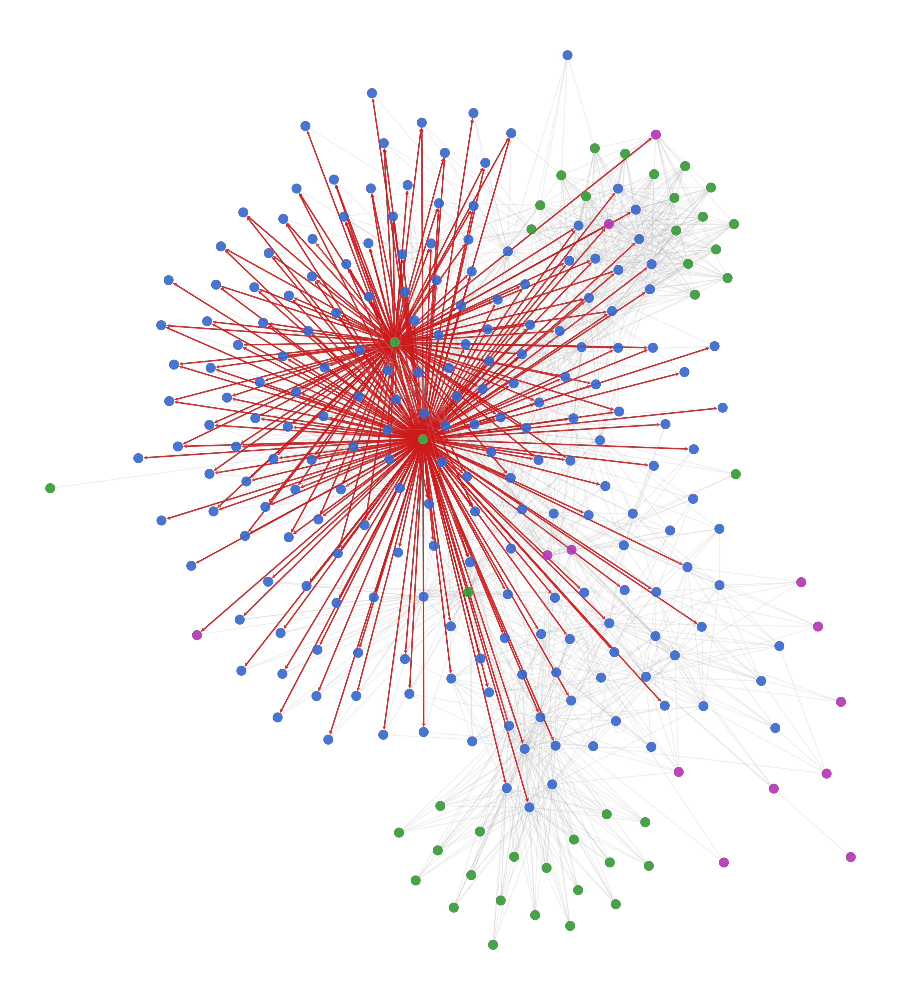

In [1]:
import pandas as pd
import numpy as np
import graph_tool.all as gt
import matplotlib.pyplot as plt

# ================== 1. Load data and subset one foodweb ==================
CSV = "../../src/matlab/data/backbone_stats/all_link_stats_long.csv"

df = pd.read_csv(CSV)

# Select one foodweb (small-ish one)
fw = "Kongsfjorden_tax_mass"
df_fw = df[df["Foodweb"] == fw].copy()

print(f"Foodweb {fw}: {len(df_fw)} edges in full net "
      f"({df_fw['IsBackbone'].sum()} backbone edges)")

# ================== 2. Build graph from edge list ==================
# MATLAB indices are 1-based → convert to 0-based
n_nodes = int(max(df_fw["Source"].max(), df_fw["Target"].max()))

g = gt.Graph(directed=True)
g.add_vertex(n_nodes)  # vertices 0..n_nodes-1

# Edge properties
e_is_backbone = g.new_edge_property("bool")
e_color = g.new_edge_property("vector<double>")
e_pen_width = g.new_edge_property("double")

# Helper colors: RGBA in [0,1]
BACKBONE_COLOR = [0.80, 0.10, 0.10, 0.9]  # dark red
NONBACK_COLOR  = [0.70, 0.70, 0.70, 0.2]  # light grey (transparent)

for _, row in df_fw.iterrows():
    u = int(row["Source"]) - 1
    v = int(row["Target"]) - 1
    e = g.add_edge(u, v)
    is_bb = bool(row["IsBackbone"])
    e_is_backbone[e] = is_bb
    if is_bb:
        e_color[e] = BACKBONE_COLOR
        e_pen_width[e] = 3.0
    else:
        e_color[e] = NONBACK_COLOR
        e_pen_width[e] = 2.0

# ================== 3. Build vertex attributes (mass, role) ==================
v_mass = g.new_vertex_property("double")
v_size = g.new_vertex_property("double")
v_role = g.new_vertex_property("string")
v_color = g.new_vertex_property("vector<double>")

# --- Collect node-level metadata from the edge table ---
node_mass = {}
node_role = {}

if "Source_mass" in df_fw.columns:
    for _, row in df_fw.iterrows():
        s = int(row["Source"])
        t = int(row["Target"])

        # Mass
        if not pd.isna(row.get("Source_mass", np.nan)):
            node_mass[s] = float(row["Source_mass"])
        if not pd.isna(row.get("Target_mass", np.nan)):
            node_mass[t] = float(row["Target_mass"])

        # Role  (keep original string, but strip whitespace)
        if "Source_role" in df_fw.columns and not pd.isna(row.get("Source_role", np.nan)):
            node_role[s] = str(row["Source_role"]).strip()
        if "Target_role" in df_fw.columns and not pd.isna(row.get("Target_role", np.nan)):
            node_role[t] = str(row["Target_role"]).strip()

# --- Normalize mass to reasonable node sizes ---
if node_mass:
    masses = np.array(list(node_mass.values()))
    # avoid crazy outliers: take log10 and rescale
    logm = np.log10(masses + 1e-8)
    logm_min, logm_max = logm.min(), logm.max()
    if logm_max > logm_min:
        scaled = 10 + 30 * (logm - logm_min) / (logm_max - logm_min)
    else:
        scaled = np.full_like(logm, 20.0)

    # map back to node id → size
    mass2size = {nid: sz for nid, sz in zip(node_mass.keys(), scaled)}
else:
    mass2size = {}

# --- Explicit color palette for roles ---
# consumer = purple, consumer-resource = blue, resource = green
role_palette = {
    "consumer":           [0.70, 0.20, 0.70, 0.9],  # purple
    "consumer-resource":  [0.20, 0.40, 0.80, 0.9],  # blue
    "resource":           [0.20, 0.60, 0.20, 0.9],  # green
}

# default color if no role or unexpected label
DEFAULT_NODE_COLOR = [0.30, 0.30, 0.30, 0.9]

# --- Assign vertex properties ---
for v in g.vertices():
    idx = int(v) + 1  # back to 1-based to look up dicts

    # mass & size
    m = node_mass.get(idx, np.nan)
    v_mass[v] = 0.0 if np.isnan(m) else m
    v_size[v] = mass2size.get(idx, 12.0)  # default size if missing

    # role & color
    r = node_role.get(idx, None)
    if r is not None:
        v_role[v] = r
        v_color[v] = role_palette.get(r, DEFAULT_NODE_COLOR)
    else:
        v_role[v] = ""
        v_color[v] = DEFAULT_NODE_COLOR

pos = gt.sfdp_layout(g)  # force-directed; good default

gt.graph_draw(
    g,
    pos=pos,
    vertex_size=v_size,
    vertex_fill_color=v_color,
    vertex_pen_width=0.3,
    edge_color=e_color,
    edge_pen_width=e_pen_width,
    bg_color=[1, 1, 1, 1],
    output_size=(2000, 2000)
)

plt.show()
plt.close()

Found 290 foodwebs in CSV. Plotting at most 10.
[1] Foodweb SF1M2: 16 edges in full net (7 backbone edges)


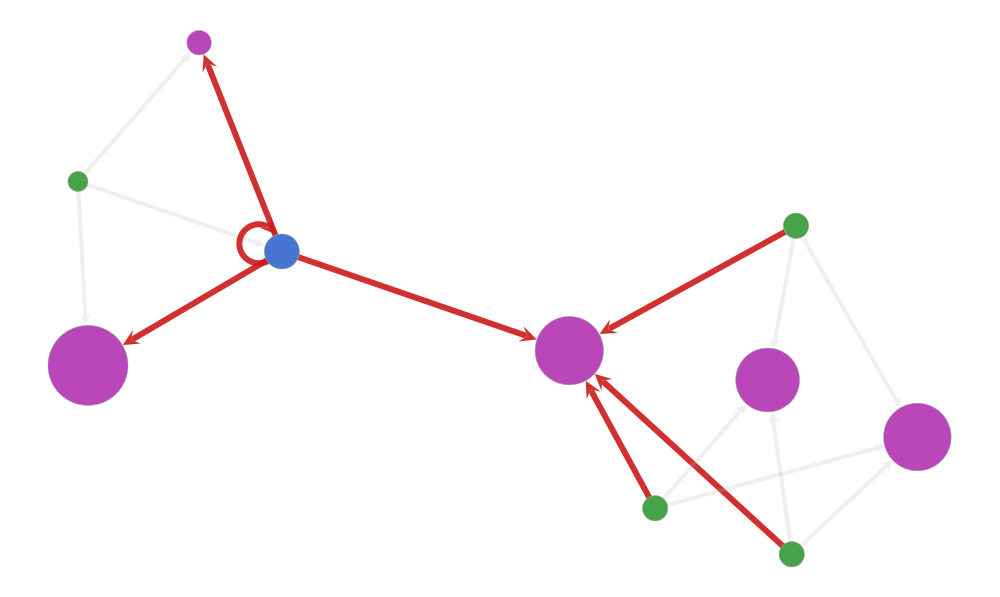

[2] Foodweb PP1I3: 24 edges in full net (7 backbone edges)


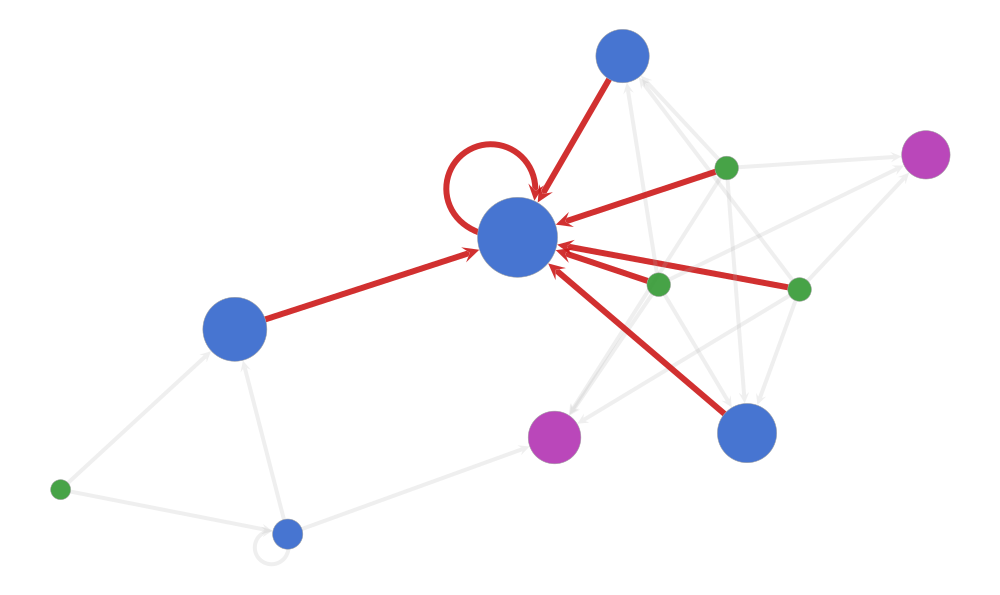

[3] Foodweb SP1: 24 edges in full net (7 backbone edges)


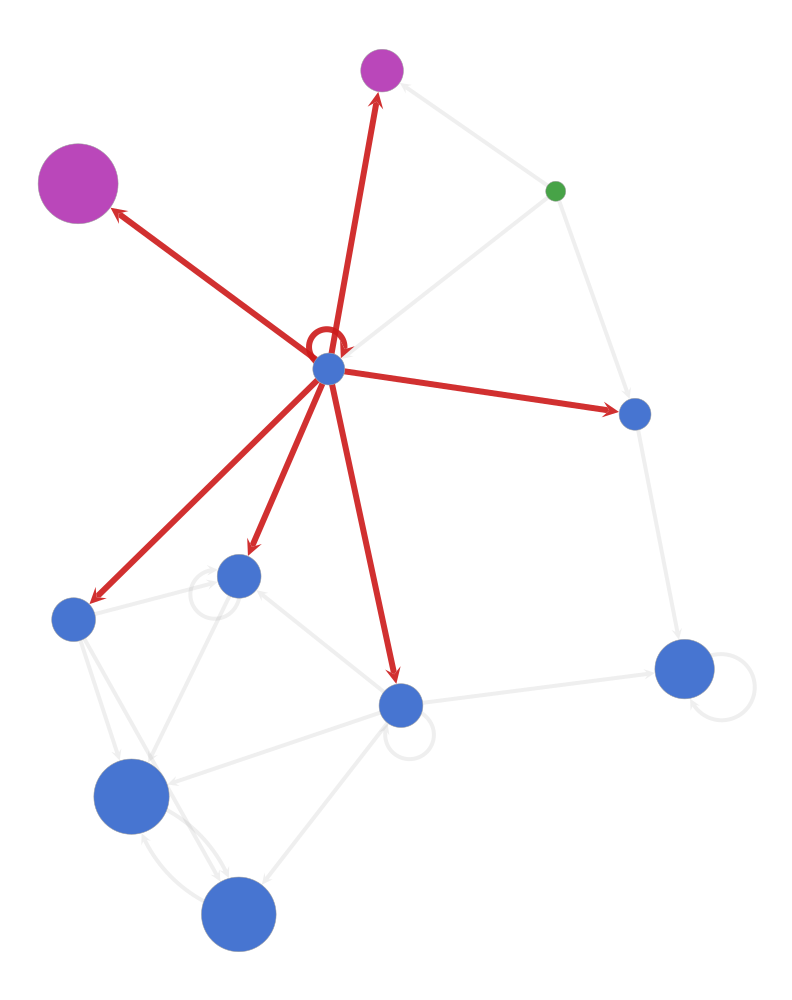

[4] Foodweb PC2P5: 33 edges in full net (8 backbone edges)


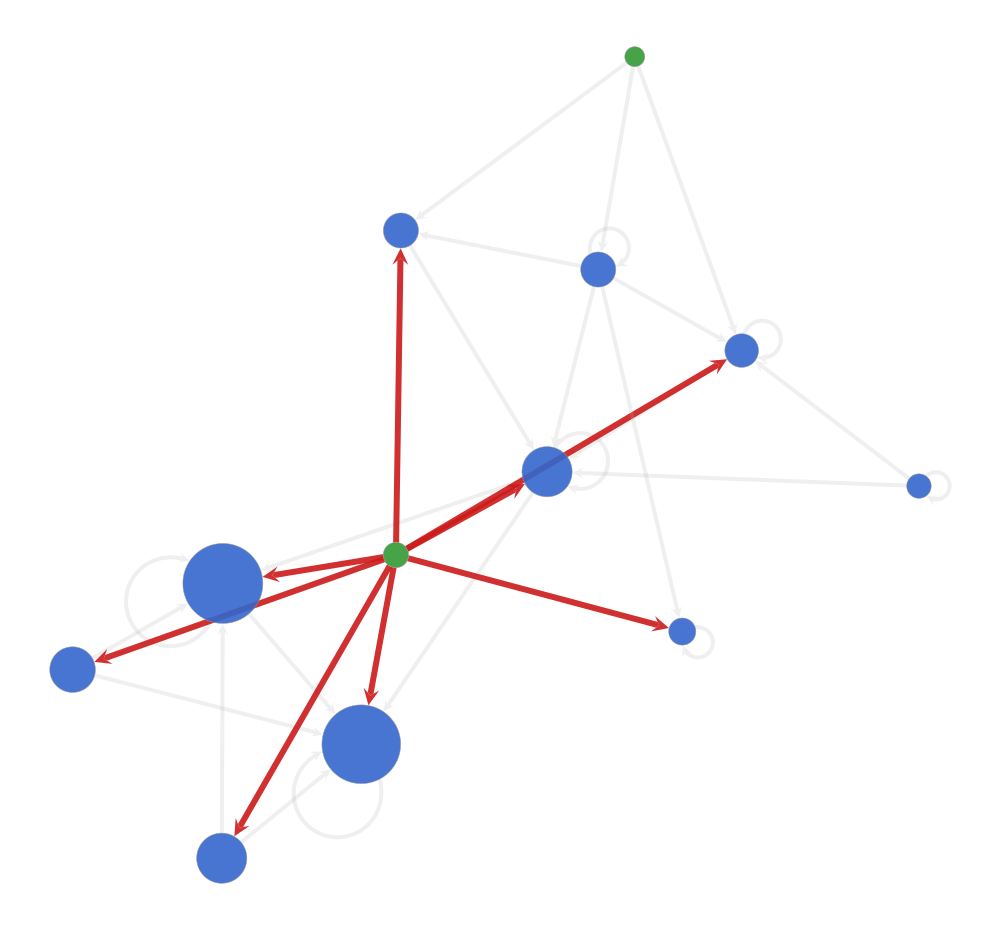

[5] Foodweb SF1M1: 28 edges in full net (7 backbone edges)


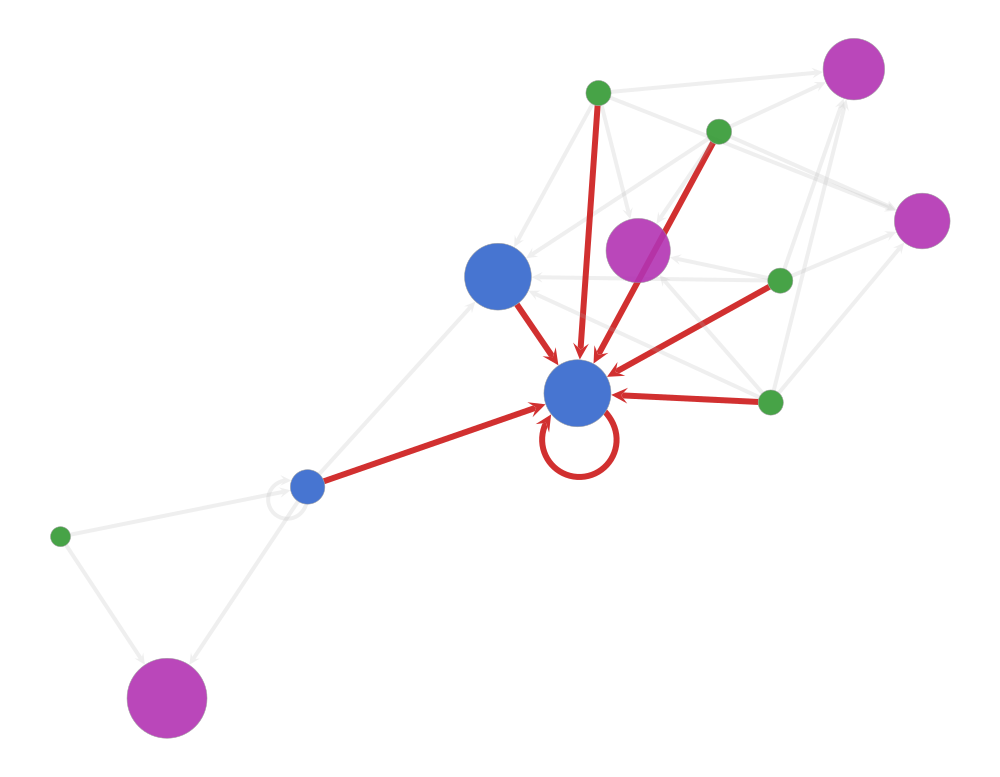

[6] Foodweb AP4: 24 edges in full net (7 backbone edges)


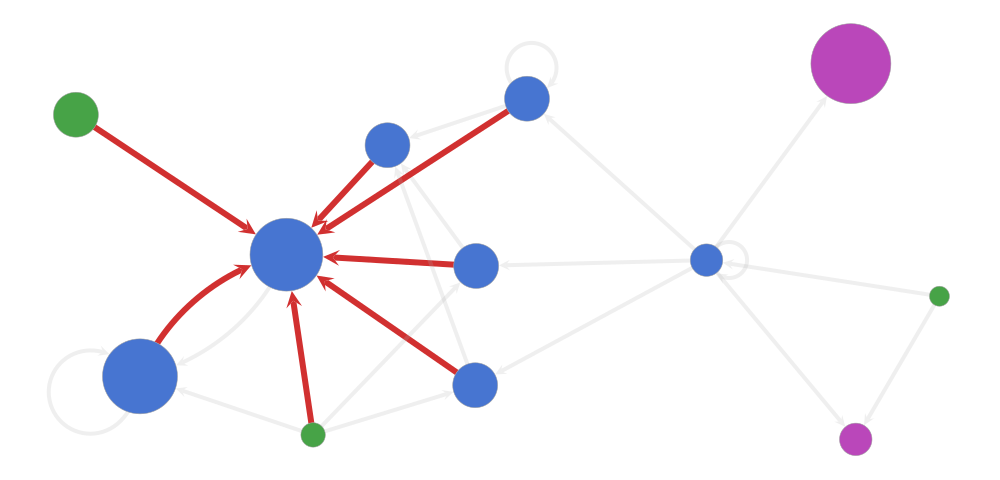

[7] Foodweb Twin Lake East: 17 edges in full net (6 backbone edges)


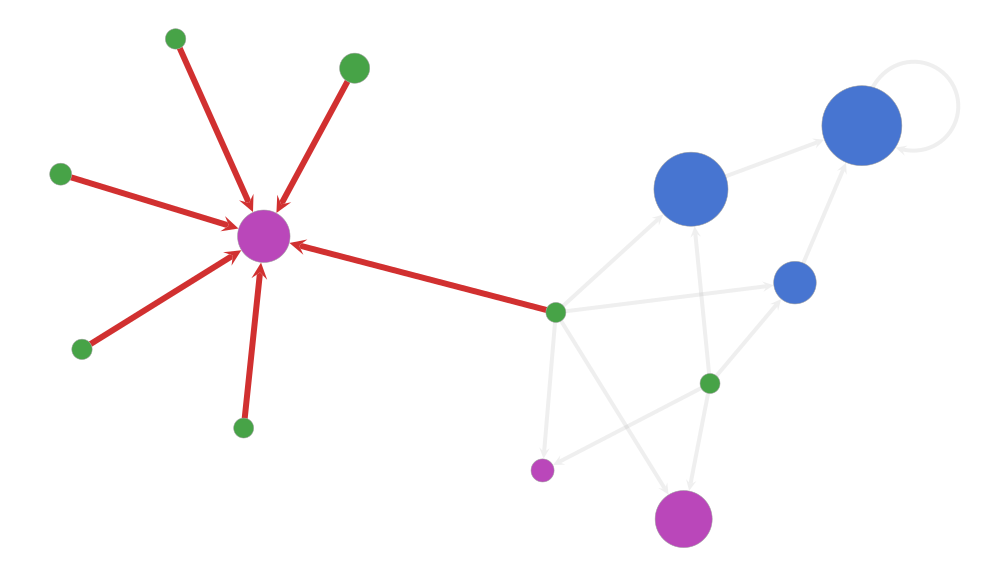

[8] Foodweb AP1: 17 edges in full net (7 backbone edges)


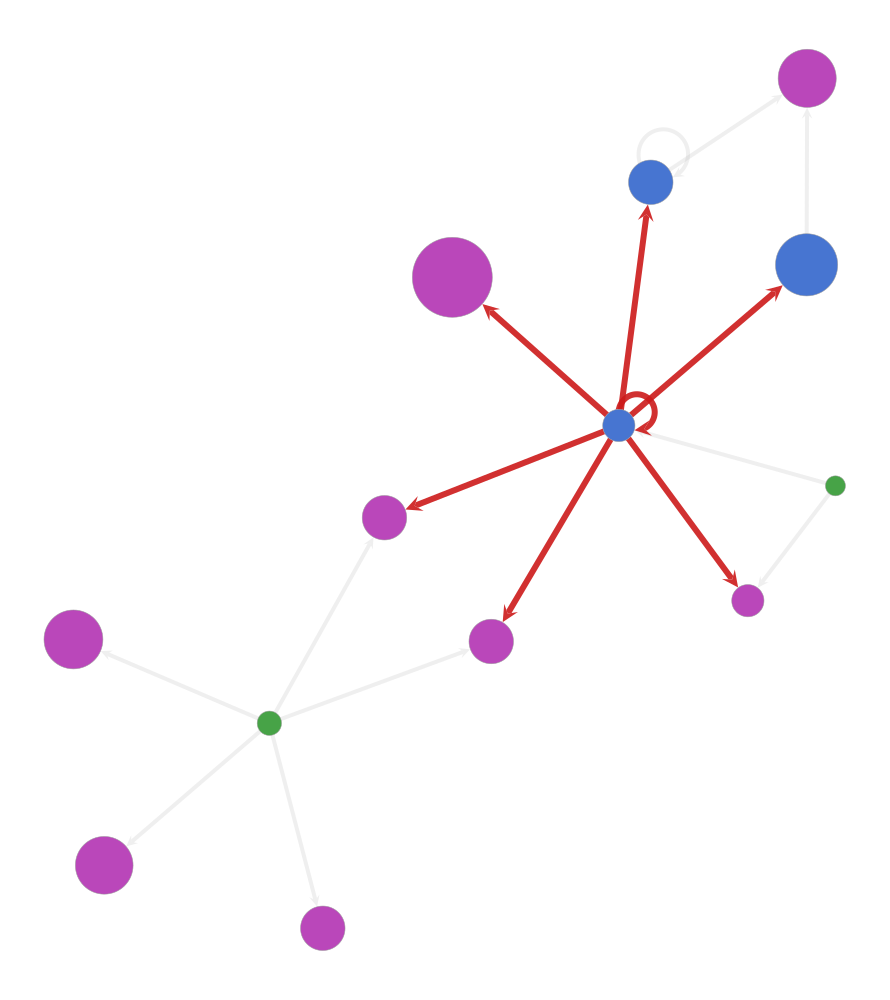

[9] Foodweb Svalbard: 21 edges in full net (10 backbone edges)


/var/folders/37/n26ttb4n16xb2c3z17l2p6r00000gp/T/ipykernel_1488/2572212192.py:88: RuntimeWarning: invalid value encountered in log10
  logm = np.log10(masses + 1e-8)


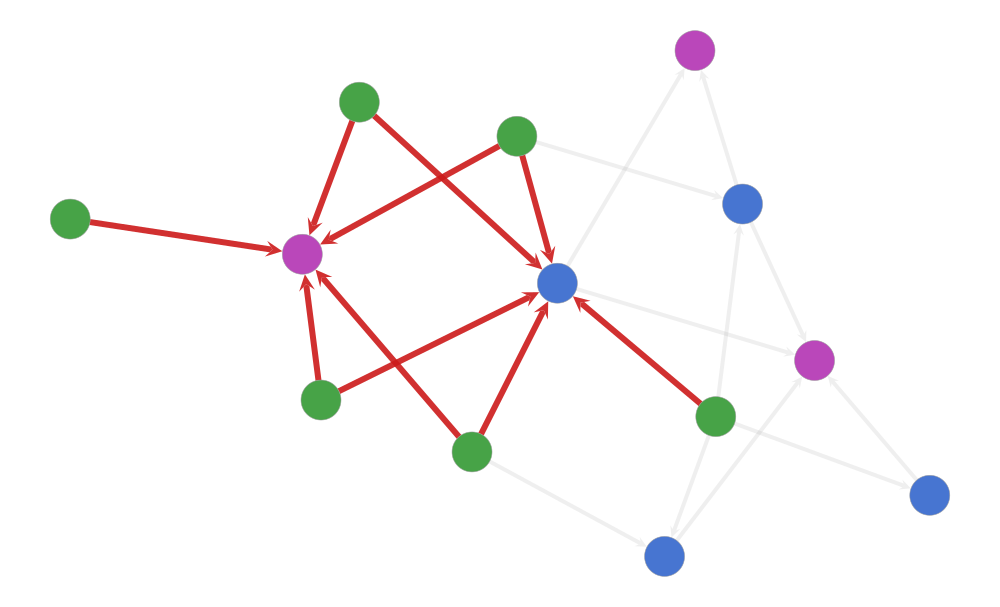

[10] Foodweb PP1I2: 30 edges in full net (24 backbone edges)


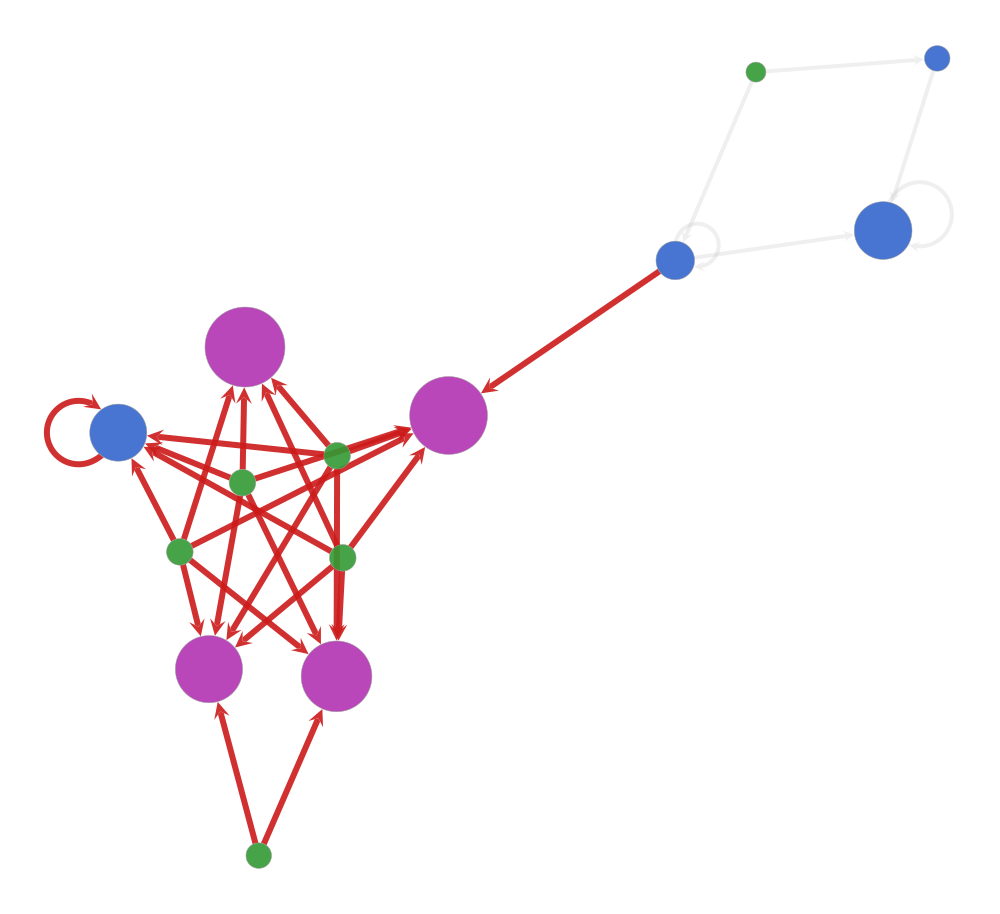

In [2]:
import pandas as pd
import numpy as np
import graph_tool.all as gt
import matplotlib.pyplot as plt

# ================== 1. Load data ==================
CSV = "../../src/matlab/data/backbone_stats/all_link_stats_long.csv"
df = pd.read_csv(CSV)

# How many foodwebs to plot at most
MAX_PLOTS = 10

foodwebs = df["Foodweb"].unique()
print(f"Found {len(foodwebs)} foodwebs in CSV. Plotting at most {MAX_PLOTS}.")

# ================== LOOP OVER FOODWEBS ==================
for idx, fw in enumerate(foodwebs, start=1):
    if idx > MAX_PLOTS:
        break

    df_fw = df[df["Foodweb"] == fw].copy()

    print(
        f"[{idx}] Foodweb {fw.split('_')[0]}: {len(df_fw)} edges in full net "
        f"({df_fw['IsBackbone'].sum()} backbone edges)"
    )

    # ---------- 2. Build graph from edge list ----------
    # MATLAB indices are 1-based → convert to 0-based
    n_nodes = int(max(df_fw["Source"].max(), df_fw["Target"].max()))

    g = gt.Graph(directed=True)
    g.add_vertex(n_nodes)  # vertices 0..n_nodes-1

    # Edge properties
    e_is_backbone = g.new_edge_property("bool")
    e_color = g.new_edge_property("vector<double>")
    e_pen_width = g.new_edge_property("double")

    # Helper colors: RGBA in [0,1]
    BACKBONE_COLOR = [0.80, 0.10, 0.10, 0.9]  # dark red
    NONBACK_COLOR  = [0.70, 0.70, 0.70, 0.2]  # light grey (transparent)

    for _, row in df_fw.iterrows():
        u = int(row["Source"]) - 1
        v = int(row["Target"]) - 1
        e = g.add_edge(u, v)
        is_bb = bool(row["IsBackbone"])
        e_is_backbone[e] = is_bb
        if is_bb:
            e_color[e] = BACKBONE_COLOR
            e_pen_width[e] = 3.0
        else:
            e_color[e] = NONBACK_COLOR
            e_pen_width[e] = 2.0

    # ---------- 3. Build vertex attributes (mass, role) ----------
    v_mass = g.new_vertex_property("double")
    v_size = g.new_vertex_property("double")
    v_role = g.new_vertex_property("string")
    v_color = g.new_vertex_property("vector<double>")

    # --- Collect node-level metadata from the edge table ---
    node_mass = {}
    node_role = {}

    if "Source_mass" in df_fw.columns:
        for _, row in df_fw.iterrows():
            s = int(row["Source"])
            t = int(row["Target"])

            # Mass
            if not pd.isna(row.get("Source_mass", np.nan)):
                node_mass[s] = float(row["Source_mass"])
            if not pd.isna(row.get("Target_mass", np.nan)):
                node_mass[t] = float(row["Target_mass"])

            # Role  (keep original string, but strip whitespace)
            if "Source_role" in df_fw.columns and not pd.isna(row.get("Source_role", np.nan)):
                node_role[s] = str(row["Source_role"]).strip()
            if "Target_role" in df_fw.columns and not pd.isna(row.get("Target_role", np.nan)):
                node_role[t] = str(row["Target_role"]).strip()

    # --- Normalize mass to reasonable node sizes ---
    if node_mass:
        masses = np.array(list(node_mass.values()))
        # avoid crazy outliers: take log10 and rescale
        logm = np.log10(masses + 1e-8)
        logm_min, logm_max = logm.min(), logm.max()
        if logm_max > logm_min:
            scaled = 10 + 30 * (logm - logm_min) / (logm_max - logm_min)
        else:
            scaled = np.full_like(logm, 20.0)

        # map back to node id → size
        mass2size = {nid: sz for nid, sz in zip(node_mass.keys(), scaled)}
    else:
        mass2size = {}

    # --- Explicit color palette for roles ---
    # consumer = purple, consumer-resource = blue, resource = green
    role_palette = {
        "consumer":           [0.70, 0.20, 0.70, 0.9],  # purple
        "consumer-resource":  [0.20, 0.40, 0.80, 0.9],  # blue
        "resource":           [0.20, 0.60, 0.20, 0.9],  # green
    }

    # default color if no role or unexpected label
    DEFAULT_NODE_COLOR = [0.30, 0.30, 0.30, 0.9]

    # --- Assign vertex properties ---
    for v in g.vertices():
        idx_v = int(v) + 1  # back to 1-based to look up dicts

        # mass & size
        m = node_mass.get(idx_v, np.nan)
        v_mass[v] = 0.0 if np.isnan(m) else m
        v_size[v] = mass2size.get(idx_v, 12.0)  # default size if missing

        # role & color
        r = node_role.get(idx_v, None)
        if r is not None:
            v_role[v] = r
            v_color[v] = role_palette.get(r, DEFAULT_NODE_COLOR)
        else:
            v_role[v] = ""
            v_color[v] = DEFAULT_NODE_COLOR

    # ---------- 4. Layout and draw ----------
    pos = gt.sfdp_layout(g)  # force-directed; good default

    # Let graph_tool create and manage its own figure; just show it
    gt.graph_draw(
        g,
        pos=pos,
        vertex_size=v_size,
        vertex_fill_color=v_color,
        vertex_pen_width=0.3,
        edge_color=e_color,
        edge_pen_width=e_pen_width,
        bg_color=[1, 1, 1, 1],
        output_size=(500, 500),
    )
    plt.show()
    plt.close()